# Longitudinal Attention Fusion Model (LAFM)

## Helper function

In [30]:
## Helper function

%cd "~/projects/spartDM"
%load_ext autoreload
%autoreload 2

import os

print(f"Current working dir: {os.getcwd()}")

import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

%matplotlib inline

from functools import partial

import torch
import torch.nn as nn
import torchvision
from einops import rearrange, repeat
from skimage.filters import threshold_otsu, threshold_yen

from src.ldae.utils import feature_distance, heat_map, patchify
from src.utils.visualization import (
    draw_featmap,
    plot_comparison_starmen,
    plot_fam_error_histogram,
    plot_kde_pixel,
)


# Helper function to quick plot a tensor using torchvision grid
def quick_plot_tensor(x, title, normalize=True):
    """
    x: torch.tensor of size(B, C, H, W)
    """
    if isinstance(x, np.ndarray):
        x = torch.tensor(x, dtype=torch.float32)
    grid = torchvision.utils.make_grid(x, nrow=10, normalize=normalize, padding=1)  # noqa: F821
    plt.figure(figsize=(16, 4))  
    plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
    plt.title(title)
    plt.axis("off")


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
to_torch = partial(torch.tensor, dtype=torch.float32, device=device)


DATA_DIR = "data/starmen/output_random_noacc"
WORK_DIR = "workdir/diffae_starmen"

/home/kdang/projects/spartDM
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working dir: /home/kdang/projects/spartDM


/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/IPython/core/magics/osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [ ]:
# Threshold function

def norm_tensor(tensor, eps=1e-8):
    my_max = torch.max(tensor)
    my_min = torch.min(tensor)
    range_ = my_max - my_min

    if range_ < eps:
        return torch.zeros_like(tensor) 
    else:
        return (tensor - my_min) / range_

# Median filter
from scipy.signal import medfilt2d


def median_filter_2D(volume, kernelsize=5):
    """
    volume: torch.Tensor(c, h, w) | torch.Tensor(b, c, h, w)
    """
    volume = volume.cpu().numpy()
    volume_mf = np.zeros_like(volume)
    if volume.ndim == 4: # (b, c, h w)
        for i in range(len(volume)):
            for j in range(volume.shape[1]):
                volume_mf[i, j, :, :] = medfilt2d(volume[i, j, :, :], kernel_size=kernelsize)
    elif volume.ndim == 3: # (b, h, w)
        for i in range(len(volume)):
            volume_mf[i, :, :] = medfilt2d(volume[i, :, :], kernel_size=kernelsize)
    return torch.Tensor(volume_mf)

# Yen threshold
# Binary structure
from scipy.ndimage import binary_dilation, generate_binary_structure
from skimage.filters import threshold_yen


def bin_dilation(volume, structure):
    volume_dil = volume.clone().cpu().numpy()
    volume = volume.cpu().numpy()
    for i in range(len(volume)):
        volume_dil[i] = binary_dilation(volume[i], structure=structure)
    return torch.Tensor(volume_dil)

In [ ]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt


def plot_example_heat_map(x, xhat, ano_gt, ano_map, f_d, i_d, heatmap_v):
    fig = plt.figure(figsize=(10, 8))
    gs = gridspec.GridSpec(3, 4, figure=fig, wspace=0.05, hspace=0.3, width_ratios=[1,1,1,1])

    # Turn off all axes by default
    axes = [[fig.add_subplot(gs[i, j]) for j in range(4)] for i in range(3)]
    for row in axes:
        for ax in row:
            ax.axis("off")

    # Plot original image
    ax = axes[0][0]
    ax.imshow(x, cmap="gray")
    ax.set_title("origin")

    # Plot ground truth anomaly
    if ano_gt is not None:
        ax = axes[0][3]
        ax.imshow(ano_gt, cmap="gray")
        ax.set_title("annotation")

    # Reconstruction xT_infer
    ax = axes[1][0]
    ax.imshow(xhat, cmap="gray")
    ax.set_title("reconstruction")
    ax.set_ylabel("xT_infer")

    # Pixel distance
    ax = axes[1][1]
    ax.imshow(i_d.squeeze(), cmap="inferno")
    ax.set_title("pixel distance")

    # Feature distance
    ax = axes[1][2]
    ax.imshow(f_d.squeeze(), cmap="inferno")
    ax.set_title("feature distance")
    
    # Anomaly map
    ax = axes[1][3]
    ax.imshow(ano_map.squeeze(), cmap="inferno")
    ax.set_title(f"anomaly score v={heatmap_v}")

    # Histogram: pixel density between x and xhat
    ax = axes[2][0]
    # ax.hist(x.squeeze().flatten(), bins=30, alpha=0.6, label="input", density=True, histtype="step")
    # ax.hist(xhat.squeeze().flatten(), bins=30, alpha=0.6, label="recons", density=True, histtype="step")
    xs = [x.squeeze().flatten(), xhat.squeeze().flatten()]
    labels = ["input", "recons"]
    ax.hist(xs, bins=30, alpha=0.6, label=labels, density=True, histtype="step")
    ax.set_title("pixel density")
    ax.legend()

    # Histogram: pixel distance
    ax = axes[2][1]
    if ano_gt is not None:
        i_d_ano = i_d.squeeze()[ano_gt > 0]
        i_d_ht = i_d.squeeze()[ano_gt == 0]

        # ax.hist(i_d_ano, bins=30, alpha=0.6, label="anomaly", density=True)
        # ax.hist(i_d_ht, bins=30, alpha=0.6, label="healthy", density=True)

        xs = [i_d_ht, i_d_ano]
        labels = ["healthy", "anomaly"]
        ax.hist(xs, bins=30, alpha=0.6, label=labels, density=True, histtype="stepfilled")
    else: 
        ax.hist(i_d.squeeze().flatten(), bins=30, alpha=0.6, label="healthy", density=True, histtype="stepfilled")
    ax.legend()


    # Histogram: feature distance
    ax = axes[2][2]
    if ano_gt is not None:
        f_d_ano = f_d.squeeze()[ano_gt > 0]
        f_d_ht = f_d.squeeze()[ano_gt == 0]
        # ax.hist(f_d_ano, bins=30, alpha=0.6, label="anomaly", density=True)
        # ax.hist(f_d_ht, bins=30, alpha=0.6, label="healthy", density=True)
        xs = [f_d_ht, f_d_ano]
        labels = ["healthy", "anomaly"]
        ax.hist(xs, bins=30, alpha=0.6, label=labels, density=True, histtype="stepfilled")
    else: 
        ax.hist(f_d.squeeze().flatten(), bins=30, alpha=0.6, label="healthy", density=True, histtype="stepfilled")
    ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

    # Histogram: anomaly map
    ax = axes[2][3]
    if ano_gt is not None:
        ano_map_ano = ano_map.squeeze()[ano_gt > 0]
        ano_map_ht = ano_map.squeeze()[ano_gt == 0]
        # ax.hist(ano_map_ano, bins=30, alpha=0.6, label="anomaly", density=True)
        # ax.hist(ano_map_ht, bins=30, alpha=0.6, label="healthy", density=True)
        xs = [ano_map_ht, ano_map_ano]
        labels = ["healthy", "anomaly"]
        ax.hist(xs, bins=30, alpha=0.6, label=labels, density=True, histtype="stepfilled")
    else: 
        ax.hist(ano_map.squeeze().flatten(), bins=30, alpha=0.6, label="healthy", density=True, histtype="stepfilled")
    ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

    # Customize histogram axes in third row
    for ax in [axes[2][0], axes[2][1], axes[2][2], axes[2][3]]:
        ax.axis("on")
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.tick_params(
            axis='both',
            which='both',
            bottom=True,
            top=False,
            left=False,
            right=False,
            labelbottom=True,
            labelleft=False
        )


    # plt.tight_layout()
    plt.show()



## Load spatial Diffusion Model

In [4]:
# CondDDPM model

from lightning.pytorch.utilities.model_summary import ModelSummary

from src.ldae import CondDDPM

## Load model
ckpt_path = os.path.join(WORK_DIR, "representation-learning", "checkpoints", "best.ckpt")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

sdm_litmodel = CondDDPM.load_from_checkpoint(ckpt_path, map_location=device)

# Model summary

summary = ModelSummary(sdm_litmodel, max_depth=2)
print(summary)

Backbone model loaded successfully.
Frozen first 0 layers out of 161 in the backbone

   | Name                      | Type               | Params | Mode 
--------------------------------------------------------------------------
0  | decoder                   | CondUNet           | 2.5 M  | train
1  | decoder.time_embed        | Sequential         | 20.7 K | train
2  | decoder.label_emb         | Linear             | 65.7 K | train
3  | decoder.input_blocks      | ModuleList         | 517 K  | train
4  | decoder.middle_block      | TimestepSequential | 469 K  | train
5  | decoder.output_blocks     | ModuleList         | 1.4 M  | train
6  | decoder.out               | Sequential         | 353    | train
7  | encoder                   | SemanticEncoder    | 24.6 M | train
8  | encoder.backbone          | BackboneBaseModule | 24.6 M | train
9  | ema_encoder               | SemanticEncoder    | 24.6 M | eval 
10 | ema_encoder.backbone      | BackboneBaseModule | 24.6 M | eval 
11 | ema_de

In [5]:
model = sdm_litmodel.decoder.input_blocks

from torchinfo import summary

x = torch.randn(10, 1, 64, 64)
emb = sdm_litmodel.decoder.time_embed(torch.randn(10, 32))
shift_emb = sdm_litmodel.decoder.label_emb(torch.randn(10, 512))

hs = []
h = x
for module in sdm_litmodel.decoder.input_blocks:
    # print(module)
    h = module(h, emb, shift_emb)
    print(h.shape)

torch.Size([10, 32, 64, 64])
torch.Size([10, 32, 64, 64])
torch.Size([10, 32, 32, 32])
torch.Size([10, 64, 32, 32])
torch.Size([10, 64, 16, 16])
torch.Size([10, 96, 16, 16])


## Load temporal diffusion model

In [6]:
from src.ldae import TADMLitModel

tadm_ckpt_path = os.path.join(WORK_DIR, "tadm", "checkpoints", "best.ckpt")

ckpt = torch.load(tadm_ckpt_path, map_location=device)

tadm_litmodel = TADMLitModel.load_from_checkpoint(tadm_ckpt_path, map_location=device)

print(ModelSummary(tadm_litmodel, max_depth=1))

  | Name        | Type     | Params | Mode 
-------------------------------------------------
0 | encoder     | RRDBNet  | 5.9 M  | train
1 | decoder     | TADMUnet | 2.4 M  | train
2 | ema_encoder | RRDBNet  | 5.9 M  | eval 
3 | ema_decoder | TADMUnet | 2.4 M  | eval 
-------------------------------------------------
8.3 M     Trainable params
8.3 M     Non-trainable params
16.6 M    Total params
66.462    Total estimated model params size (MB)
614       Modules in train mode
614       Modules in eval mode


## Load FE model

In [7]:
# Fine-tuned feature extractor model

from lightning.pytorch.utilities.model_summary import ModelSummary

from src.ldae import CondDDPM, FeatureExtractorLitmodel

## Load model
ckpt_path = os.path.join(WORK_DIR, "fe-train", "checkpoints", "best.ckpt")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

diffae_litmodel = FeatureExtractorLitmodel.load_from_checkpoint(ckpt_path, map_location=device)

fe = diffae_litmodel.fe
fe = fe.float()
fe.eval()

# Model summary

summary = ModelSummary(diffae_litmodel, max_depth=1)
print(summary)

Backbone model loaded successfully.
Frozen first 0 layers out of 161 in the backbone

Freeze ema_encoder from DDPM models.
Delete litmodel. Only keep UNet and Encoder
  | Name    | Type             | Params | Mode
----------------------------------------------------
0 | encoder | SemanticEncoder  | 24.6 M | eval
1 | unet    | CondUNet         | 2.5 M  | eval
2 | fe      | FeatureExtractor | 17.1 M | eval
----------------------------------------------------
8.5 M     Trainable params
27.1 M    Non-trainable params
35.6 M    Total params
142.422   Total estimated model params size (MB)
0         Modules in train mode
615       Modules in eval mode


## DataLoader

In [8]:
from monai.data import DataLoader
from monai.data.utils import first
from src.data.datamodules import StarmenDataset

train_ds = StarmenDataset(
    data_dir="data/starmen/output_random_noacc",
    split="train",
    nb_subject=None,
)

test_ds = StarmenDataset(
    data_dir="data/starmen/output_random_noacc",
    split="test",
    nb_subject=None,
)

growing_circle_ds = StarmenDataset(
    data_dir="data/starmen/output_random_noacc",
    split="growing_circle20",
    nb_subject=None,
)

train_loader = DataLoader(train_ds, batch_size=20, shuffle=True, num_workers=1)

# one_batch = first(iter(train_loader))

test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)

growing_circle_loader = DataLoader(growing_circle_ds, batch_size=1, shuffle=True, num_workers=1)

darker_line_ds = StarmenDataset(
    data_dir="data/starmen/output_random_noacc",
    split="darker_line20",
    nb_subject=None,
)
darker_line_loader = DataLoader(darker_line_ds, batch_size=1, shuffle=True, num_workers=1)

darker_circle_ds = StarmenDataset(
    data_dir="data/starmen/output_random_noacc",
    split="darker_circle20",
    nb_subject=None,
)
darker_circle_loader = DataLoader(darker_circle_ds, batch_size=1, shuffle=True, num_workers=1)

# Combined dataset
combine_ds = StarmenDataset(
    data_dir="data/starmen/output_random_noacc",
    split="test_combine",
    nb_subject=None,
)
combine_loader = DataLoader(combine_ds, batch_size=1, shuffle=True, num_workers=1)

## LAFM and FAM

In [ ]:
from src.ldae.modules.anomaly_detection import FAM, LAFM

lafm = LAFM()
fam = FAM(fe=fe, 
          fe_layers=["layer1", "layer2"], 
          heatmap_v=1.)

In [ ]:
"""
This code cells is factored into LAFM class. So no need to run this cell again. 
"""

def temp_filter_gaussian(ano_maps, time_idx, ages, sigma=1., use_normalize=True):
    """
    Perform temporal smoothing over all anomaly map across timepoint
    """

    ano_map_ref = torch.cat((
        ano_maps[:time_idx],
        ano_maps[time_idx+1:]
    ))
    age_ref = torch.cat((
        ages[:time_idx],
        ages[time_idx+1:]
    ))
    diff_age_ref = torch.abs(ages[time_idx] - age_ref)

    # Gaussain weight decay
    if sigma != 0:
        weights = torch.exp(- (diff_age_ref ** 2) / (2 * sigma**2))
        if weights.sum() > 0:
            weights = weights / weights.sum()
        elif weights.sum() == 0:
            weights = weights = torch.ones_like(weights) / len(weights)
        
        ano_map_ref = ano_map_ref * rearrange(weights, "t -> t 1 1 1")

    # Smooth temporal anomaly maps referecne
    maxv = torch.max(ano_map_ref, dim=0)[0]
    meanv = torch.mean(ano_map_ref, dim=0)

    # anomaly_map = 0.0 * maxv + 1. * meanv + 0.5 * ano_map[time_idx].squeeze()
    ano_map_ref = 0.0 * maxv + 1. * meanv
    ano_map_ref_norm = norm_tensor(ano_map_ref)

    # update current anomaly map
    beta = 1.
    gamma = 0.0
    ano_map_new = ano_maps[time_idx] * (1 - beta * (1 - ano_map_ref_norm)) + gamma * ano_map_ref_norm

    # median filter and norm of ano_map_diff
    ano_map_mf = median_filter_2D(ano_map_new, kernelsize=3)
    if use_normalize:
        ano_map_mf = norm_tensor(ano_map_mf)

    return ano_map_mf, ano_map_ref

def temp_filter_gaussian_loop(ano_maps, ages, sigma=1., use_normalize=True, nb_loop=1):
    ano_map_new = ano_maps.clone()
    ano_map_ref = ano_maps.clone()

    for loop in range(nb_loop):
        is_last = loop == nb_loop - 1
        for i in range(ano_maps.shape[0]):
            ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_maps, 
                                                                  time_idx=i, 
                                                                  ages=ages, 
                                                                  sigma=sigma,
                                                                  use_normalize=is_last if use_normalize else False,)
        
        ano_maps = ano_map_new

    return ano_map_new, ano_map_ref

def temp_filter_gaussian_one_patient(ano_map, age, i_d, mask=None, sigma=1.0, use_normalize=True):
    if mask is None:
        mask = torch.ones(ano_map.shape[0])
    ano_map = ano_map[mask == 1]
    age = age[mask == 1]
    i_d = i_d[mask == 1]

    ano_map_new = torch.zeros_like(ano_map)
    ano_map_ref = torch.zeros_like(ano_map)

    for i in range(ano_map.shape[0]):
        ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_map, i, age, sigma=sigma, use_normalize=use_normalize)
    if torch.isnan(ano_map_new).any():
        print("nan value")

    # Yen threshold

    ano_map_new_raw = ano_map_new.clone()

    ano_map_new = norm_tensor(ano_map_new)
    thrs = threshold_yen(ano_map_new.numpy())
    thrs
    ano_map_yen_seg = torch.where(ano_map_new > thrs, 1., 0.)

    i_d_new = i_d * ano_map_new
    i_d_new = norm_tensor(i_d_new)
    i_d_thrs = threshold_yen(i_d_new.numpy())
    i_d_yen_seg = torch.where(i_d_new > i_d_thrs, 1. , 0. )

    yen_seg = i_d_yen_seg * ano_map_yen_seg
    
    if not use_normalize:
        # Return the unormalized ano map
        ano_map_new = ano_map_new_raw
        
    return {
        "ano_map": ano_map,
        "ano_map_new": ano_map_new,
        "ano_map_ref": ano_map_ref,
        "yen_seg": yen_seg
    }

# Test set (healthy)

## Reconstruction files from SDM

In [319]:
# Reload the data 
import json

split = "test"
infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100_noise250")

# Test dataset
test_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)
print(f"Len of test dataset: {len(test_loader)}")


# Read the reconstruction error files to get the index and corresponding reonconstruction image
try: 
    eval_result_file = os.path.join(infer_dir, "results", "eval_dict.json")
    with open(eval_result_file, "r") as f:
        eval_dict = json.load(f)
    test_ids = eval_dict["IDs"]
    # test_ids = np.load(recons_idx_path)
    # test_ids = test_ids.squeeze().tolist()
except FileNotFoundError:
    test_ids = test_ds.ids

test_ids

# Load the original (anomalious) image from test dataset by index
x_orgs = [test_ds.get_images_by_id(id)["img"].squeeze() for id in test_ids]
x_orgs = np.stack(x_orgs).astype("float32")

# Load the groundtruth anomaly mask 
x_ano_gts = []
for id in test_ds.ids:
    x_ano_gt = test_ds.get_images_by_id(id)["anomaly_gt_seg"]

    if x_ano_gt is None:
        break
    else:
        x_ano_gts.append(x_ano_gt.squeeze())

if len(x_ano_gts) > 0: 
    x_ano_gts = np.stack(x_ano_gts).astype("float32")
    x_ano_gts.shape
else:
    x_ano_gts = None

# Load the original healthy images
# healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
x_hts = []
for id in test_ids:
    for t in range(0, 10):
        ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
        ht = np.load(ht_path)
        x_hts.append(ht)
x_hts = np.stack(x_hts)
x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
x_hts.shape

# add C dimension
x_orgs = rearrange(x_orgs, "b t h w -> b t 1 h w")
if x_ano_gts is not None:
    x_ano_gts = rearrange(x_ano_gts, "b t h w -> b t 1 h w")
x_hts = rearrange(x_hts, "b t h w -> b t 1 h w")

# # Load reconstruction - xT_inferred
# x_recons = np.load(os.path.join(infer_dir, "results", "recons.npy"))
# x_recons.shape

# Load reconstruction - from random noise
x_recons = np.load(os.path.join(infer_dir, "results", "recons_semantic.npy"))
x_recons.shape

# convert to torch

x_orgs_all = to_torch(x_orgs) if not isinstance(x_orgs, torch.Tensor) else x_orgs
x_hts_all = to_torch(x_hts) if not isinstance(x_hts, torch.Tensor) else x_hts
if x_ano_gts is not None:
    x_ano_gts_all = to_torch(x_ano_gts) if not isinstance(x_ano_gts, torch.Tensor) else x_ano_gts
x_recons_all = to_torch(x_recons) if not isinstance(x_recons, torch.Tensor) else x_recons

Len of test dataset: 150


## Load 1 batch of data

[2, 10, 30, 33, 39, 44, 65, 67, 70, 72, 81, 82, 84, 86, 88, 97, 109, 110, 118, 136, 137, 139, 141, 165, 168, 184, 192, 199, 208, 209, 210, 213, 215, 218, 227, 235, 237, 239, 244, 254, 259, 265, 275, 277, 280, 281, 286, 289, 290, 292, 294, 296, 307, 312, 314, 318, 319, 331, 332, 333, 344, 346, 351, 355, 359, 363, 371, 377, 382, 408, 428, 432, 445, 462, 468, 481, 494, 499, 501, 513, 519, 522, 523, 526, 534, 536, 543, 544, 557, 559, 575, 583, 584, 589, 590, 603, 617, 626, 635, 650, 652, 656, 662, 668, 670, 677, 678, 689, 697, 731, 734, 740, 741, 761, 764, 797, 798, 800, 802, 810, 811, 816, 820, 822, 823, 845, 865, 866, 868, 883, 892, 893, 894, 896, 899, 901, 904, 907, 917, 924, 941, 947, 950, 963, 977, 978, 985, 989, 994, 998]
tensor([-6.7300, -5.5700, -4.4100, -3.2400, -2.0800, -0.9200,  0.2400,  1.4100,
         2.5700,  3.7300])


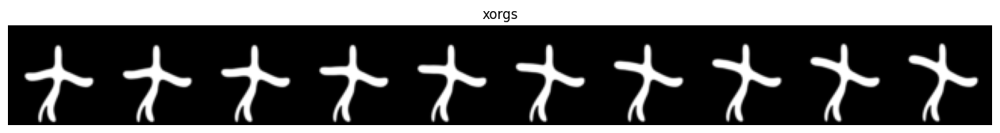

In [320]:
print(test_ids)

patient_idx = 20
patient_id = test_ids[patient_idx]

x_orgs = x_orgs_all[patient_idx]
x_hts = x_hts_all[patient_idx]
x_recons = x_recons_all[patient_idx]
if x_ano_gts is not None:
    x_ano_gts = x_ano_gts_all[patient_idx]

quick_plot_tensor(x_orgs, 'xorgs')


# Get patient meta data from dataloader
out = test_ds.get_images_by_id(patient_id)
ages = out["age"]
ages = to_torch(ages)

# sanity check
torch.all(to_torch(out["img"]).float() == x_orgs)

print(ages)


## Spatial ano detection with SDM

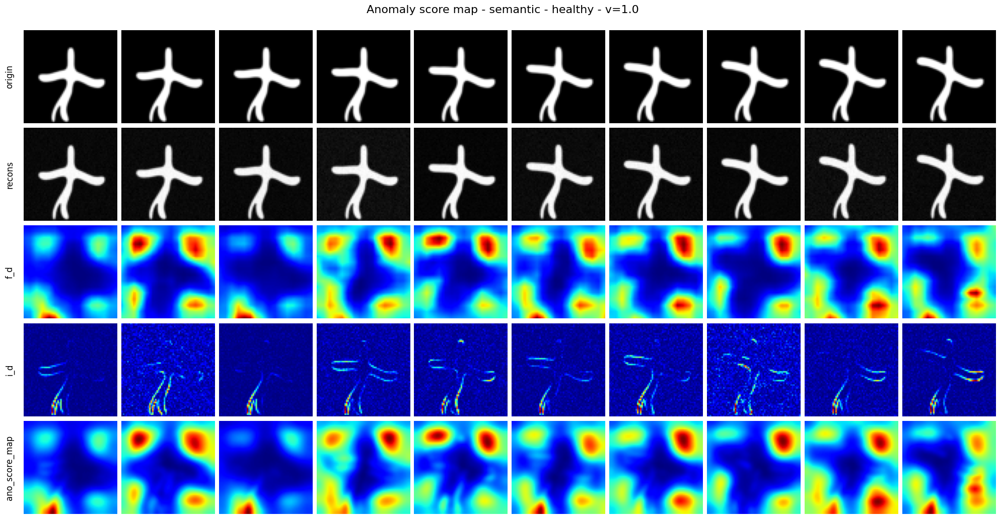

In [321]:
heatmap_v = 1.

ano_map, f_d, i_d = heat_map(
    x_recons, x_orgs, fe, v=heatmap_v, fe_layers=["layer1", "layer2"], sigma=2.
)

# Plot anomaly score map
imgs = [
    x_orgs.detach().cpu().squeeze(),
    x_recons.detach().cpu().squeeze(),
    f_d.detach().cpu().squeeze(),
    i_d.detach().cpu().squeeze(),
    ano_map.detach().cpu().squeeze(),
]

labels = ["origin", "recons", "f_d", "i_d", "ano_score_map"]

title = f"Anomaly score map - semantic - healthy - v={heatmap_v}"
opt = {"title": title}

fig = plot_comparison_starmen(
    imgs,
    labels,
    is_errors=[False, False, True, True, True],
    opt=opt,
    same_cbar=False,
    display_cbar=True,
)

### Post processing

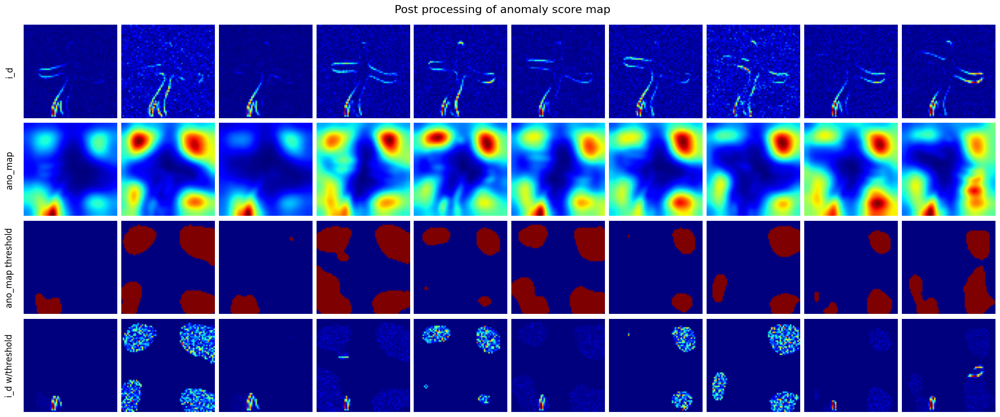

In [322]:
# Post processing of anomaly score map

ano_map_norm = ano_map.clone()
for i in range(ano_map.shape[0]):
    ano_map_norm[i] = norm_tensor(ano_map[i])
ano_map_norm.shape

# median filter
ano_map_mf = median_filter_2D(ano_map, kernelsize=3)

# Yen threshold
ano_map_yen_seg = torch.zeros_like(ano_map)

for i in range(ano_map_mf.shape[0]):
    thr = threshold_yen(ano_map_mf[i].numpy())
    ano_map_yen_seg[i] = torch.where(ano_map_mf[i] > thr, 1.0, 0.0)

# Plot
fig = plot_comparison_starmen(
    imgs=[i_d.squeeze(),
          ano_map.squeeze(), 
          ano_map_yen_seg.squeeze(),
          (i_d * ano_map_yen_seg).squeeze()
          ],
    labels=["i_d", "ano_map", "ano_map threshold", "i_d w/threshold"],
    is_errors=[True, True, True, True, True],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)

### Temporal smooth for ano_map

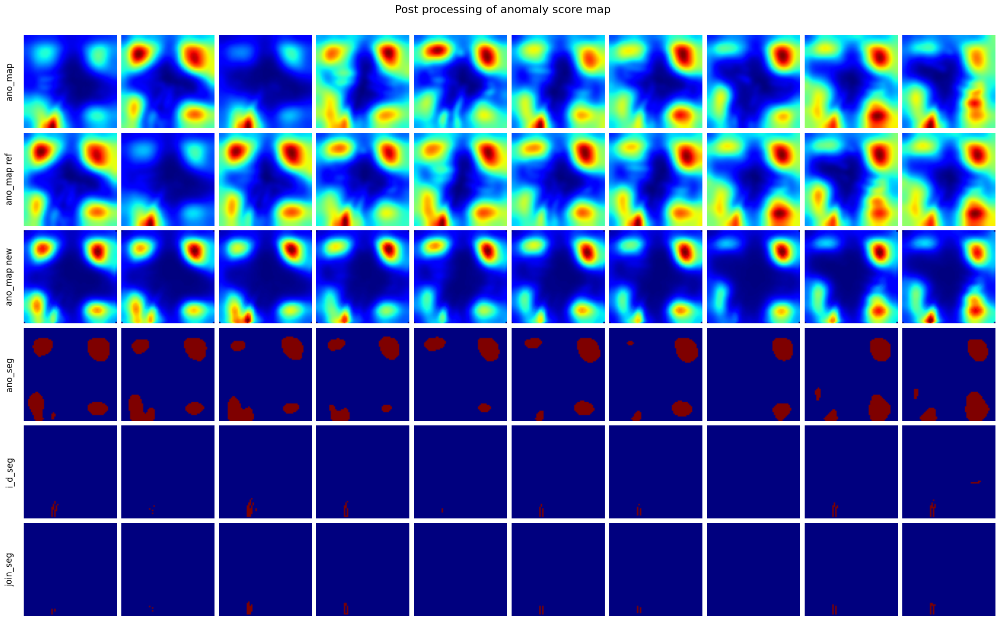

In [323]:
ano_map_new = ano_map.clone()
ano_map_ref = ano_map.clone()

for i in range(ano_map.shape[0]):
    ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_map, i, ages, sigma=0.1)
    
# # Multiple smoothing loop
# ano_map_new, ano_map_ref = temp_filter_gaussian_loop(
#     ano_maps=ano_map,
#     ages=ages,
#     use_normalize=True,
#     nb_loop=1
# )

# Yen threshold
thrs = threshold_yen(ano_map_new.numpy())
thrs
ano_map_yen_seg = torch.where(ano_map_new > thrs, 1., 0.)


i_d_new = i_d * ano_map_new
# i_d_new = (i_d + ano_map_new)/2
i_d_thrs = threshold_yen(i_d_new.numpy())
i_d_yen_seg = torch.where(i_d_new > i_d_thrs, 1. , 0. )
# plot
fig = plot_comparison_starmen(
    imgs=[ano_map.squeeze(),
          ano_map_ref.squeeze(),
          ano_map_new.squeeze(),
          ano_map_yen_seg.squeeze(),
          i_d_yen_seg.squeeze(),
          (ano_map_yen_seg * i_d_yen_seg).squeeze()
        #   ano_map_mf.squeeze(),
        #   ano_map_yen_seg.squeeze(),
          ],
    labels=["ano_map", "ano_map ref", "ano_map new", "ano_seg", "i_d_seg", "join_seg"],
    is_errors=[True, True, True, True, True, True],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)

### Temporal smooth for pixel distance

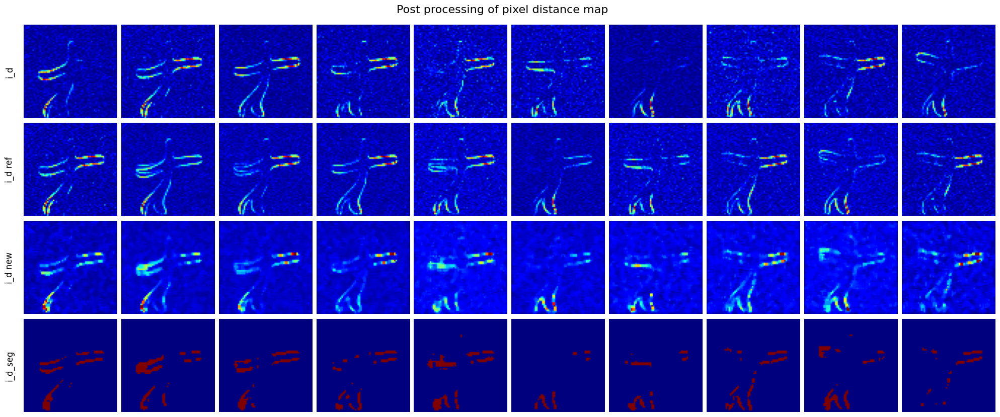

In [279]:
i_d_new = i_d.clone()
i_d_ref = i_d.clone()
for i in range(i_d.shape[0]):
    i_d_new[i], i_d_ref[i] = temp_filter_gaussian(i_d, i, ages, sigma=0.1, use_normalize=False)

# Pixel distance yen threshold
# i_d_new = i_d * ano_map_new
i_d_thrs = threshold_yen(i_d_new.numpy())
i_d_yen_seg = torch.where(i_d_new > i_d_thrs, 1. , 0. )
# plot
fig = plot_comparison_starmen(
    imgs=[i_d.squeeze(),
          i_d_ref.squeeze(),
          i_d_new.squeeze(),
          i_d_yen_seg.squeeze(),
        #   ano_map_mf.squeeze(),
        #   ano_map_yen_seg.squeeze(),
          ],
    labels=["i_d", "i_d ref", "i_d new", "i_d_seg"],
    is_errors=[True, True, True, True, True],
    same_cbar=False,
    opt={"title": "Post processing of pixel distance map"}
)

## Temporal TADM

### Choose 1 taret image

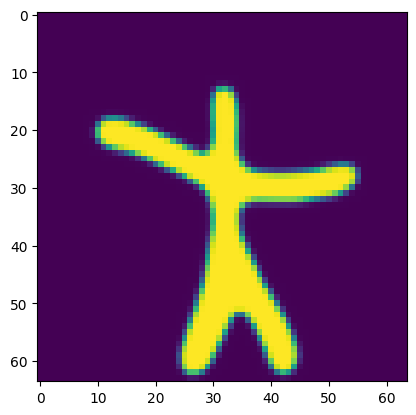

In [232]:
target_idx = 2
target_img = x_orgs[target_idx]
target_recons = x_recons[target_idx]
target_ano_map_seg = ano_map_yen_seg[target_idx]
target_ano_map = ano_map[target_idx]
target_age = ages[target_idx].unsqueeze(0)
target_i_d = i_d[target_idx]
ages

plt.imshow(target_img.squeeze())

### Propagate to future

In [233]:
next_imgs = x_orgs[target_idx+1:]
next_imgs.shape
next_ages = ages[target_idx+1:]
diff_ages = next_ages - target_age
diff_ages.shape
target_age.repeat(next_imgs.shape[0])

# Predict psuedo future scan
prev_imgs = repeat(target_recons, "c h w -> b c h w", c=1, b=next_ages.shape[0])

with torch.no_grad():
    # 1. encode image with RRDB
    rrdb_out, cond = tadm_litmodel.encoder(prev_imgs, True)

    # 2. Sampling x from trained TADMUnet
    x_pred = tadm_litmodel.gaussian_diffusion.regular_tadm_sample(
        ddim_style="ddim10",
        encoder=tadm_litmodel.encoder,
        unet=tadm_litmodel.decoder,
        x_0=prev_imgs,
        x_T=torch.randn_like(prev_imgs),
        z=cond,
        diff_ages=diff_ages,
        ages=target_age.repeat(next_imgs.shape[0]),
        disable_tqdm=False,
    )

    # 3. predict current images
    pred_to_future = prev_imgs + x_pred

sampling loop time step: 100%|██████████| 10/10 [00:01<00:00,  7.66it/s]


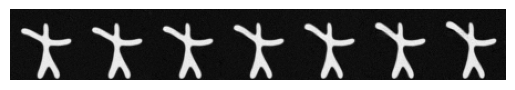

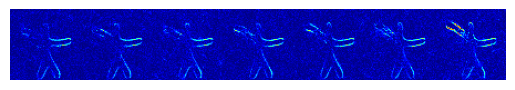

In [234]:
pred_to_future.shape
plt.imshow(rearrange(pred_to_future, "t c h w -> h (t c w)"), cmap="gray")
plt.axis("off")
plt.show()

# difference
diff_to_future = torch.abs(next_imgs - pred_to_future)
plt.imshow(rearrange(diff_to_future, "t c h w -> h (t c w)"), cmap="jet")
plt.axis("off")
plt.show()

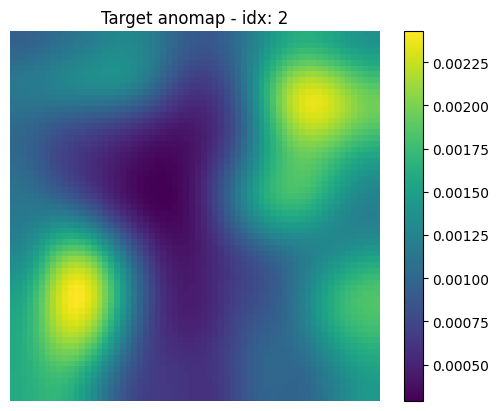

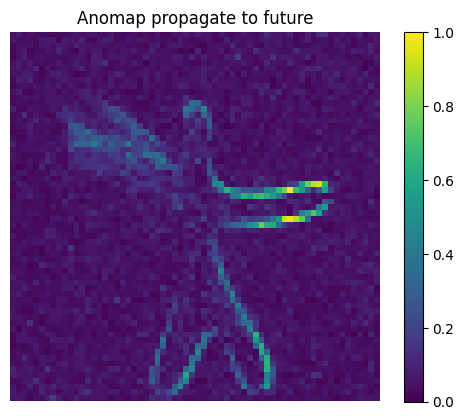

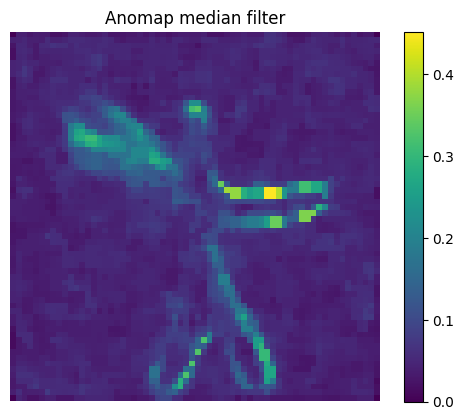

Yen threshold: 0.10136356949806213


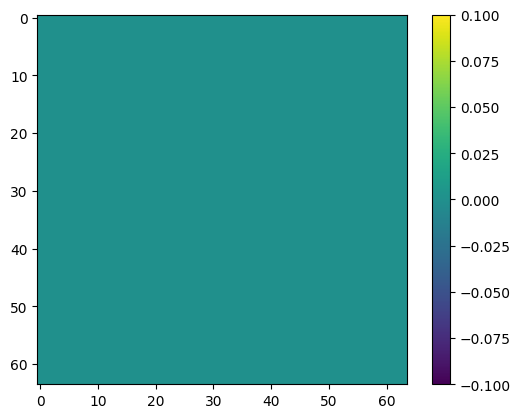

In [239]:
### MAF combination

plt.imshow(target_ano_map.squeeze())
plt.colorbar()
plt.axis("off")
plt.title(f"Target anomap - idx: {target_idx}")
plt.show()

maxv = torch.max(diff_to_future, dim=0)[0]
meanv = torch.mean(diff_to_future, dim=0)
anomaly_map = (0.0 * maxv + 1. * meanv)
anomaly_map = norm_tensor(anomaly_map)

plt.imshow(anomaly_map.squeeze())
plt.colorbar()
plt.axis("off")
plt.title("Anomap propagate to future")
plt.show()

anomaly_map_mf = median_filter_2D(anomaly_map.unsqueeze(0), kernelsize=3)
plt.imshow(anomaly_map_mf.squeeze())
plt.axis("off")
plt.title("Anomap median filter")
plt.colorbar()
plt.show()

thrs = threshold_yen(anomaly_map_mf.numpy())
print(f"Yen threshold: {thrs}")

anomaly_map_thrs = torch.where(target_ano_map > thrs, target_ano_map, 0)
plt.imshow(anomaly_map_thrs.squeeze())
plt.colorbar()
plt.show()

### TADM

In [73]:
pred_imgs = []

for i in range(target_idx - 1): 
    prev_img = x_orgs[i].unsqueeze(0)
    print(prev_img.shape)

    prev_age = ages[i].unsqueeze(0)
    diff_age = target_age - prev_age

    with torch.no_grad():
        # 1. encode image with RRDB
        rrdb_out, cond = tadm_litmodel.encoder(prev_img, True)

        # 2. Sampling x from trained TADMUnet
        x_pred = tadm_litmodel.gaussian_diffusion.regular_tadm_sample(
            ddim_style="ddim10",
            encoder=tadm_litmodel.encoder,
            unet=tadm_litmodel.decoder,
            x_0=prev_img,
            x_T=torch.randn_like(prev_img),
            z=cond,
            diff_ages=diff_age,
            ages=prev_age,
            disable_tqdm=False,
        )

        # 3. Predict future image
        pred_img = prev_img + x_pred
        pred_imgs.append(pred_img)

pred_imgs = torch.cat(pred_imgs)
pred_imgs.shape

# Error
diff_imgs = torch.abs(target_img - pred_imgs).squeeze()
diff_imgs.shape

torch.Size([1, 1, 64, 64])


sampling loop time step: 100%|██████████| 10/10 [00:00<00:00, 29.26it/s]


torch.Size([1, 1, 64, 64])


sampling loop time step: 100%|██████████| 10/10 [00:00<00:00, 31.04it/s]


torch.Size([1, 1, 64, 64])


sampling loop time step: 100%|██████████| 10/10 [00:00<00:00, 32.27it/s]


torch.Size([1, 1, 64, 64])


sampling loop time step: 100%|██████████| 10/10 [00:00<00:00, 32.50it/s]


### Plot

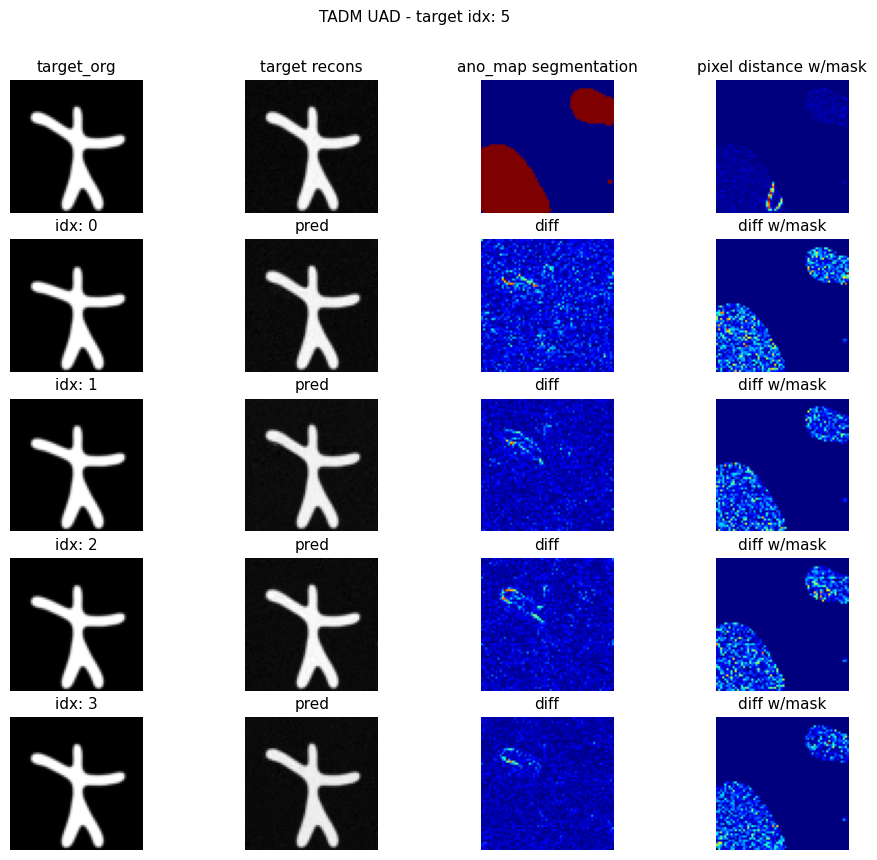

In [128]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, 
                       figure=fig,
                    #    width_ratios=[1, 1, 1], 
                    #    height_ratios=[1, 1, 1]
                       )

fig.subplots_adjust(
    # left=0.05, right=0.95,  # shrink/grow figure margins
    # bottom=0.1, top=1.0,
    wspace=0.05, hspace=0.2  # spacing between subplots
)

ax1 = fig.add_subplot(gs[0, 0])    
ax2 = fig.add_subplot(gs[0, 1])     
ax3 = fig.add_subplot(gs[0, 2])     
# ax_cb = fig.add_subplot(gs[1, 0]) 

# target image
ax1.imshow(target_img.squeeze(), cmap="gray") 
ax1.axis("off")
ax1.set_title(f"target_org")

# target reconstruction
ax2.imshow(target_recons.squeeze(), cmap="gray") 
ax2.axis("off")
ax2.set_title(f"target recons")

# target ano map segmentation
ax3.imshow(target_ano_map_seg.squeeze(), cmap="jet") 
ax3.axis("off")
ax3.set_title("ano_map segmentation")

# target pixel distance
ax = fig.add_subplot(gs[0, 3])
img = (target_i_d * target_ano_map_seg).squeeze()
ax.imshow(img, cmap="jet") 
ax.axis("off")
ax.set_title("pixel distance w/mask")

# reconstruction from previous images
for i in range(target_idx - 1):
    # source img
    ax = fig.add_subplot(gs[i+1, 0]) 
    ax.imshow(x_orgs[i].squeeze(), cmap="gray")
    ax.set_title(f"idx: {i}")
    ax.axis("off")

    # pred img
    ax = fig.add_subplot(gs[i+1, 1]) 
    ax.imshow(pred_imgs[i].squeeze(), cmap="gray")
    ax.set_title(f"pred")
    ax.axis("off")

    # difference 
    ax = fig.add_subplot(gs[i+1, 2]) 
    img = diff_imgs[i].squeeze()
    ax.imshow(img, cmap="jet")
    ax.set_title(f"diff")
    ax.axis("off")

    # difference w/mask
    ax = fig.add_subplot(gs[i+1, 3]) 
    img = diff_imgs[i] * target_ano_map_seg.squeeze()
    ax.imshow(img, cmap="jet")
    ax.set_title(f"diff w/mask")
    ax.axis("off")




for ax in fig.get_axes():  # get all axes in the figure
    ax.title.set_fontsize(11)
fig.suptitle(f"TADM UAD - target idx: {target_idx}", fontsize=11, y=0.95)

# plt.tight_layout()
plt.show()

### MAF combination

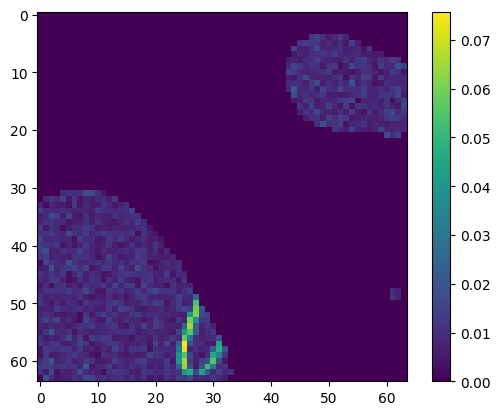

In [127]:
i_d_concat = torch.concat(
    (diff_imgs * target_ano_map_seg.squeeze(),
     target_i_d * target_ano_map_seg
     ), 
    dim=0
).squeeze()

i_d_concat.shape

maxv = torch.max(i_d_concat, dim=0)[0]
meanv = torch.mean(i_d_concat, dim=0)
# fv = f_d[time_idx].squeeze()

# anomaly_map = 0.0 * maxv + 1. * meanv + 0.5 * ano_map[time_idx].squeeze()
anomaly_map = 0. * maxv + 1. * meanv 

plt.imshow(anomaly_map)
plt.colorbar()

# Darker_line20

## Reconstruction fildes from SDM

In [297]:
# Reload the data 
import json

split = "darker_line20"
infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100_noise250")

# Test dataset
test_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)
print(f"Len of test dataset: {len(test_loader)}")


# Read the reconstruction error files to get the index and corresponding reonconstruction image
try: 
    eval_result_file = os.path.join(infer_dir, "results", "eval_dict.json")
    with open(eval_result_file, "r") as f:
        eval_dict = json.load(f)
    test_ids = eval_dict["IDs"]
    # test_ids = np.load(recons_idx_path)
    # test_ids = test_ids.squeeze().tolist()
except FileNotFoundError:
    test_ids = test_ds.ids

test_ids

# Load the original (anomalious) image from test dataset by index
x_orgs = [test_ds.get_images_by_id(id)["img"].squeeze() for id in test_ids]
x_orgs = np.stack(x_orgs).astype("float32")

# Load the groundtruth anomaly mask 
x_ano_gts = []
for id in test_ds.ids:
    x_ano_gt = test_ds.get_images_by_id(id)["anomaly_gt_seg"]

    if x_ano_gt is None:
        break
    else:
        x_ano_gts.append(x_ano_gt.squeeze())

if len(x_ano_gts) > 0: 
    x_ano_gts = np.stack(x_ano_gts).astype("float32")
x_ano_gts.shape

# Load the original healthy images
# healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
x_hts = []
for id in test_ids:
    for t in range(0, 10):
        ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
        ht = np.load(ht_path)
        x_hts.append(ht)
x_hts = np.stack(x_hts)
x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
x_hts.shape

# add C dimension
x_orgs = rearrange(x_orgs, "b t h w -> b t 1 h w")
x_ano_gts = rearrange(x_ano_gts, "b t h w -> b t 1 h w")
x_hts = rearrange(x_hts, "b t h w -> b t 1 h w")

# # Load reconstruction - xT_inferred
# x_recons = np.load(os.path.join(infer_dir, "results", "recons.npy"))
# x_recons.shape

# Load reconstruction - from random noise
x_recons = np.load(os.path.join(infer_dir, "results", "recons_semantic.npy"))
x_recons.shape

# convert to torch

x_orgs_all = to_torch(x_orgs) if not isinstance(x_orgs, torch.Tensor) else x_orgs
x_hts_all = to_torch(x_hts) if not isinstance(x_hts, torch.Tensor) else x_hts
x_ano_gts_all = to_torch(x_ano_gts) if not isinstance(x_ano_gts, torch.Tensor) else x_ano_gts
x_recons_all = to_torch(x_recons) if not isinstance(x_recons, torch.Tensor) else x_recons

Len of test dataset: 20


## Load 1 batch of data

tensor([-3.5700, -2.4700, -1.3700, -0.2800,  0.8200,  1.9200,  3.0200,  4.1100,
         5.2100,  6.3100])


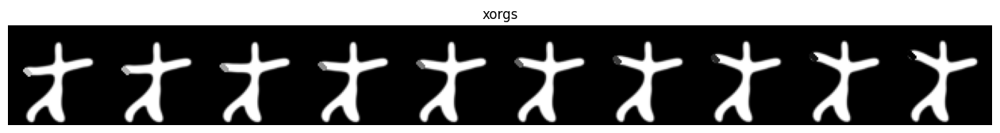

In [298]:
patient_idx = 10
patient_id = test_ids[patient_idx]

x_orgs = x_orgs_all[patient_idx]
x_hts = x_hts_all[patient_idx]
x_ano_gts = x_ano_gts_all[patient_idx]
x_recons = x_recons_all[patient_idx]

quick_plot_tensor(x_orgs, 'xorgs')


# Get patient meta data from dataloader
out = darker_line_ds.get_images_by_id(patient_id)
ages = out["age"]
ages = to_torch(ages)

# sanity check
torch.all(to_torch(out["img"]).float() == x_orgs)

print(ages)


## Spatial anomaly detection with SDM

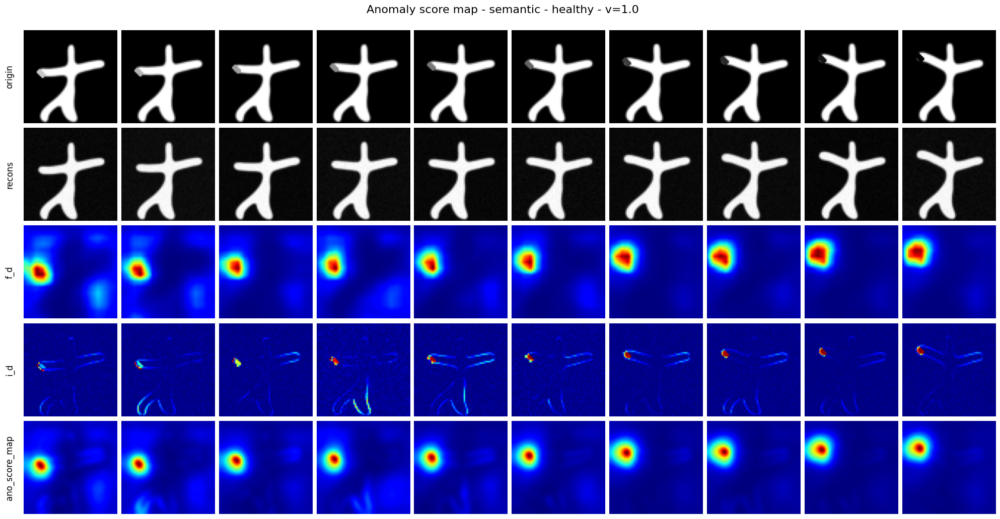

In [299]:
heatmap_v = 1.

ano_map, f_d, i_d = heat_map(
    x_recons, 
    x_orgs, 
    fe, 
    v=heatmap_v, 
    fe_layers=["layer1", "layer2"], 
    sigma=2.
)

# Plot anomaly score map
imgs = [
    x_orgs.detach().cpu().squeeze(),
    x_recons.detach().cpu().squeeze(),
    f_d.detach().cpu().squeeze(),
    i_d.detach().cpu().squeeze(),
    ano_map.detach().cpu().squeeze(),
]

labels = ["origin", "recons", "f_d", "i_d", "ano_score_map"]

title = f"Anomaly score map - semantic - healthy - v={heatmap_v}"
opt = {"title": title}

fig = plot_comparison_starmen(
    imgs,
    labels,
    is_errors=[False, False, True, True, True],
    opt=opt,
    same_cbar=False,
    display_cbar=True,
)

### Temporal smooth ano_map

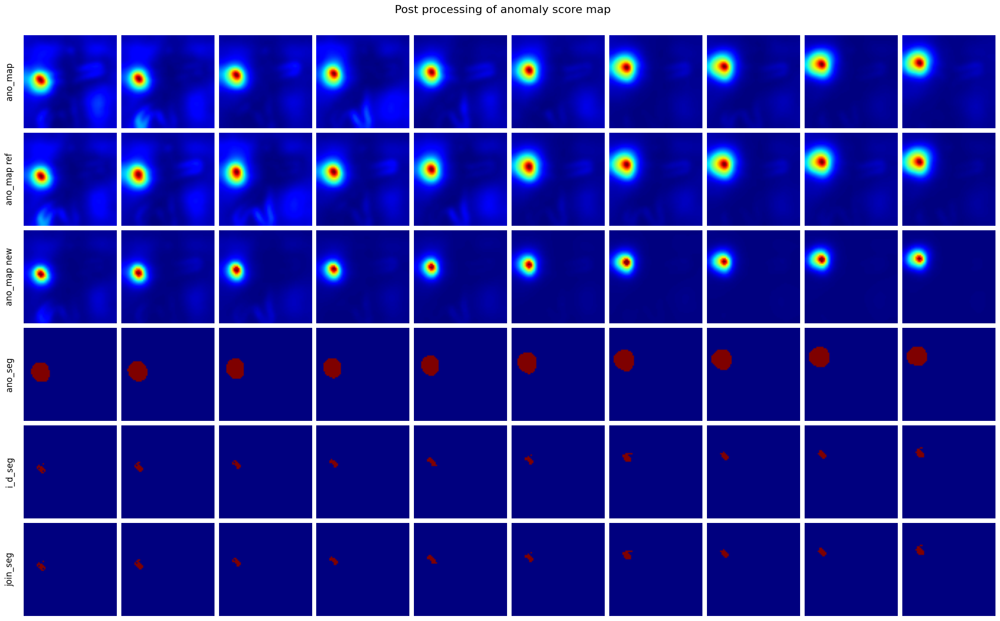

In [301]:
ano_map_new = ano_map.clone()
ano_map_ref = ano_map.clone()
for i in range(ano_map.shape[0]):
    ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_map, i, ages, sigma=0.1)


# Yen threshold
thrs = threshold_yen(ano_map_new.numpy())
thrs
ano_map_yen_seg = torch.where(ano_map_new > thrs, 1., 0.)


i_d_new = i_d * ano_map_new
i_d_thrs = threshold_yen(i_d_new.numpy())
i_d_yen_seg = torch.where(i_d_new > i_d_thrs, 1. , 0. )

# plot
fig = plot_comparison_starmen(
    imgs=[ano_map.squeeze(),
          ano_map_ref.squeeze(),
          ano_map_new.squeeze(),
          ano_map_yen_seg.squeeze(),
          i_d_yen_seg.squeeze(),
          (ano_map_yen_seg * i_d_yen_seg).squeeze()
        #   ano_map_mf.squeeze(),
        #   ano_map_yen_seg.squeeze(),
          ],
    labels=["ano_map", "ano_map ref", "ano_map new", "ano_seg", "i_d_seg", "join_seg"],
    is_errors=[True, True, True, True, True, True],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)

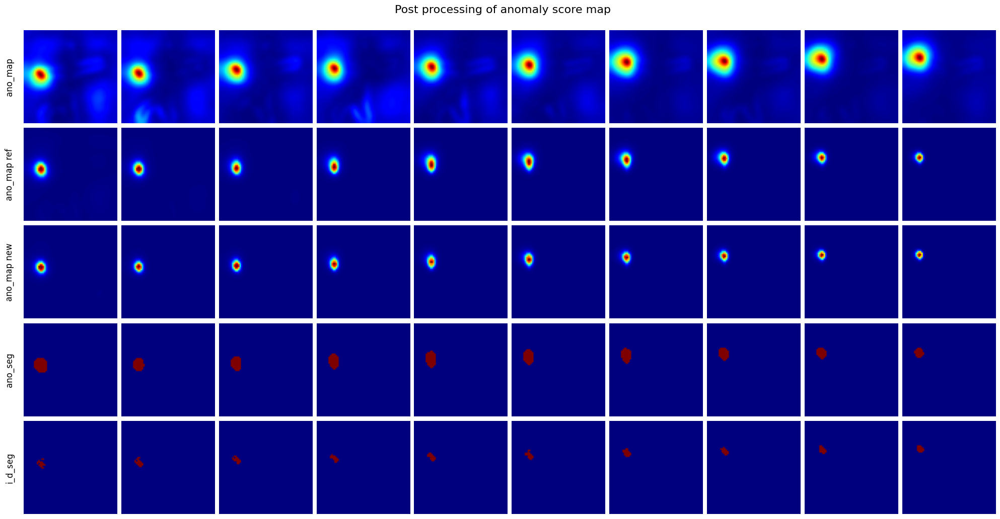

In [252]:
ano_map_new = ano_map.clone()
ano_map_ref = ano_map.clone()
# for i in range(ano_map.shape[0]):
#     ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_map, i, ages, sigma=0.1)

# Multiple smoothing loop
ano_map_new, ano_map_ref = temp_filter_gaussian_loop(
    ano_maps=ano_map,
    ages=ages,
    use_normalize=True,
    nb_loop=3
)

# Yen threshold
thrs = threshold_yen(ano_map_new.numpy())
thrs
ano_map_yen_seg = torch.where(ano_map_new > thrs, 1., 0.)


i_d_new = i_d * ano_map_new
i_d_thrs = threshold_yen(i_d_new.numpy())
i_d_yen_seg = torch.where(i_d_new > i_d_thrs, 1. , 0. )
# plot
fig = plot_comparison_starmen(
    imgs=[ano_map.squeeze(),
          ano_map_ref.squeeze(),
          ano_map_new.squeeze(),
          ano_map_yen_seg.squeeze(),
          i_d_yen_seg.squeeze(),
        #   ano_map_mf.squeeze(),
        #   ano_map_yen_seg.squeeze(),
          ],
    labels=["ano_map", "ano_map ref", "ano_map new", "ano_seg", "i_d_seg"],
    is_errors=[True, True, True, True, True],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)

# Darker circle_20

In [193]:
# Reload the data 
import json

split = "darker_circle20"
infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100_noise250")

# Test dataset
test_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)
print(f"Len of test dataset: {len(test_loader)}")


# Read the reconstruction error files to get the index and corresponding reonconstruction image
try: 
    eval_result_file = os.path.join(infer_dir, "results", "eval_dict.json")
    with open(eval_result_file, "r") as f:
        eval_dict = json.load(f)
    test_ids = eval_dict["IDs"]
    # test_ids = np.load(recons_idx_path)
    # test_ids = test_ids.squeeze().tolist()
except FileNotFoundError:
    test_ids = test_ds.ids

test_ids

# Load the original (anomalious) image from test dataset by index
x_orgs = [test_ds.get_images_by_id(id)["img"].squeeze() for id in test_ids]
x_orgs = np.stack(x_orgs).astype("float32")

# Load the groundtruth anomaly mask 
x_ano_gts = []
for id in test_ds.ids:
    x_ano_gt = test_ds.get_images_by_id(id)["anomaly_gt_seg"]

    if x_ano_gt is None:
        break
    else:
        x_ano_gts.append(x_ano_gt.squeeze())

if len(x_ano_gts) > 0: 
    x_ano_gts = np.stack(x_ano_gts).astype("float32")
x_ano_gts.shape

# Load the original healthy images
# healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
x_hts = []
for id in test_ids:
    for t in range(0, 10):
        ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
        ht = np.load(ht_path)
        x_hts.append(ht)
x_hts = np.stack(x_hts)
x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
x_hts.shape

# add C dimension
x_orgs = rearrange(x_orgs, "b t h w -> b t 1 h w")
x_ano_gts = rearrange(x_ano_gts, "b t h w -> b t 1 h w")
x_hts = rearrange(x_hts, "b t h w -> b t 1 h w")

# # Load reconstruction - xT_inferred
# x_recons = np.load(os.path.join(infer_dir, "results", "recons.npy"))
# x_recons.shape

# Load reconstruction - from random noise
x_recons = np.load(os.path.join(infer_dir, "results", "recons_semantic.npy"))
x_recons.shape

# convert to torch

x_orgs_all = to_torch(x_orgs) if not isinstance(x_orgs, torch.Tensor) else x_orgs
x_hts_all = to_torch(x_hts) if not isinstance(x_hts, torch.Tensor) else x_hts
x_ano_gts_all = to_torch(x_ano_gts) if not isinstance(x_ano_gts, torch.Tensor) else x_ano_gts
x_recons_all = to_torch(x_recons) if not isinstance(x_recons, torch.Tensor) else x_recons

Len of test dataset: 20


## Load 1 batch of data

In [194]:
test_ids

[81,
 998,
 810,
 192,
 218,
 277,
 522,
 432,
 589,
 290,
 294,
 286,
 652,
 741,
 994,
 865,
 168,
 265,
 670,
 761]

tensor([-6.0600, -5.1500, -4.2400, -3.3300, -2.4200, -1.5200, -0.6100,  0.3000,
         1.2100,  2.1200])


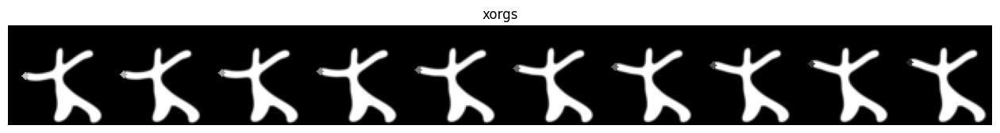

In [199]:
patient_idx = 10
patient_id = test_ids[patient_idx]

x_orgs = x_orgs_all[patient_idx]
x_hts = x_hts_all[patient_idx]
x_ano_gts = x_ano_gts_all[patient_idx]
x_recons = x_recons_all[patient_idx]

quick_plot_tensor(x_orgs, 'xorgs')


# Get patient meta data from dataloader
out = darker_circle_ds.get_images_by_id(patient_id)
ages = out["age"]
ages = to_torch(ages)

# sanity check
torch.all(to_torch(out["img"]).float() == x_orgs)

print(ages)


## Spatial anomaly detection with SDM

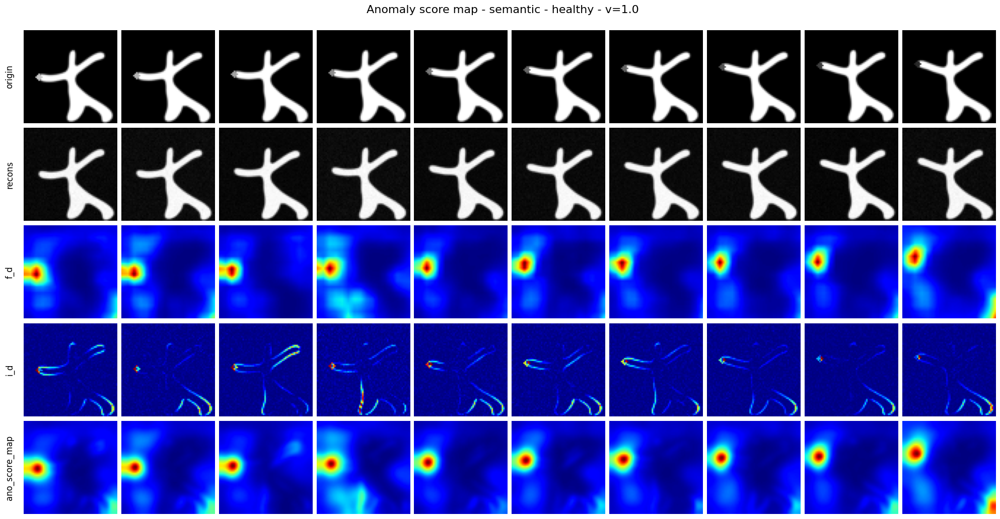

In [200]:
heatmap_v = 1.

ano_map, f_d, i_d = heat_map(
    x_recons, 
    x_orgs, 
    fe, 
    v=heatmap_v, 
    fe_layers=["layer1", "layer2"], 
    sigma=2.
)

# Plot anomaly score map
imgs = [
    x_orgs.detach().cpu().squeeze(),
    x_recons.detach().cpu().squeeze(),
    f_d.detach().cpu().squeeze(),
    i_d.detach().cpu().squeeze(),
    ano_map.detach().cpu().squeeze(),
]

labels = ["origin", "recons", "f_d", "i_d", "ano_score_map"]

title = f"Anomaly score map - semantic - healthy - v={heatmap_v}"
opt = {"title": title}

fig = plot_comparison_starmen(
    imgs,
    labels,
    is_errors=[False, False, True, True, True],
    opt=opt,
    same_cbar=False,
    display_cbar=True,
)

### Temporal smoothing ano_map

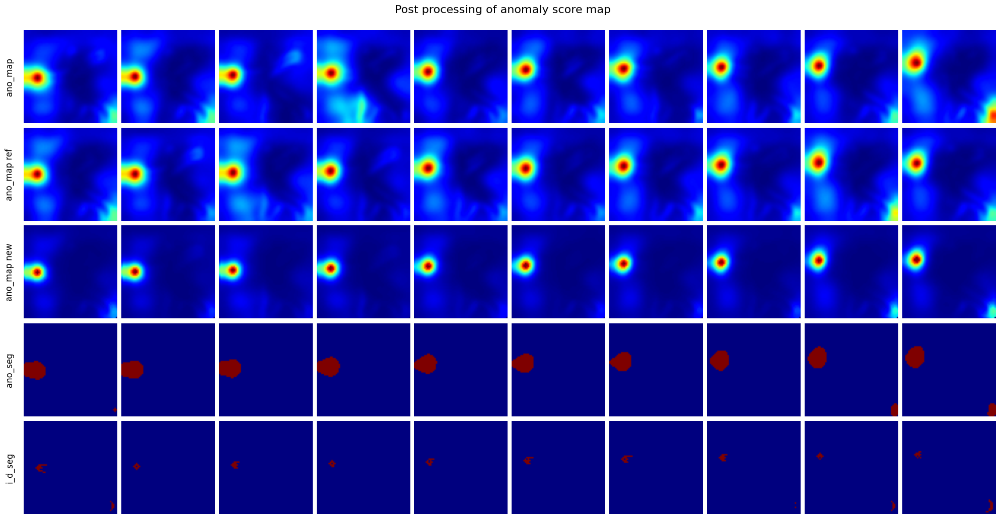

In [201]:
ano_map_new = ano_map.clone()
ano_map_ref = ano_map.clone()
for i in range(ano_map.shape[0]):
    ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_map, i, ages, sigma=0.1)

# Yen threshold
thrs = threshold_yen(ano_map_new.numpy())
thrs
ano_map_yen_seg = torch.where(ano_map_new > thrs, 1., 0.)


i_d_new = i_d * ano_map_new
i_d_thrs = threshold_yen(i_d_new.numpy())
i_d_yen_seg = torch.where(i_d_new > i_d_thrs, 1. , 0. )
# plot
fig = plot_comparison_starmen(
    imgs=[ano_map.squeeze(),
          ano_map_ref.squeeze(),
          ano_map_new.squeeze(),
          ano_map_yen_seg.squeeze(),
          i_d_yen_seg.squeeze(),
        #   ano_map_mf.squeeze(),
        #   ano_map_yen_seg.squeeze(),
          ],
    labels=["ano_map", "ano_map ref", "ano_map new", "ano_seg", "i_d_seg"],
    is_errors=[True, True, True, True, True],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)

# Combine dataset

- 150 healthy test subjects.
- 20 growing_circle anomaly
- 20 darker circle anomaly
- 20 darker line anomaly. 

In [11]:
# Reload the data 
import json

split = "test_combine"
infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100_noise250")

# Test dataset
combine_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
combine_loader = DataLoader(combine_ds, batch_size=1, shuffle=True, num_workers=1)
print(f"Len of test dataset: {len(combine_loader)}")


# Read the reconstruction error files to get the index and corresponding reonconstruction image
try: 
    eval_result_file = os.path.join(infer_dir, "results", "eval_dict.json")
    with open(eval_result_file, "r") as f:
        eval_dict = json.load(f)
    test_ids = eval_dict["IDs"]
    anomaly_types = eval_dict["anomalyType"]
    print("Load from eval_dict")
    # test_ids = np.load(recons_idx_path)
    # test_ids = test_ids.squeeze().tolist()
except FileNotFoundError:
    test_ids = test_ds.ids


# Load the original (anomalious) image from test dataset by index
x_orgs = [combine_ds.get_images_by_id(id, ano)["img"].squeeze() for id, ano in zip(test_ids, anomaly_types)]
x_orgs = np.stack(x_orgs).astype("float32")

# Load the groundtruth anomaly mask 
x_ano_gts = []
for id, ano in zip(test_ids, anomaly_types):
    x_ano_gt = combine_ds.get_images_by_id(id, ano)["anomaly_gt_seg"]

    if x_ano_gt is None:
        # x_ano_gt = torch.zeros(10, 1, 64, 64)
        x_ano_gts.append(torch.zeros(10, 64, 64))
    else:
        x_ano_gts.append(x_ano_gt.squeeze())

if len(x_ano_gts) > 0: 
    x_ano_gts = np.stack(x_ano_gts).astype("float32")
    x_ano_gts.shape

# Load the original healthy images
# healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
x_hts = []
for id in test_ids:
    for t in range(0, 10):
        ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
        ht = np.load(ht_path)
        x_hts.append(ht)
x_hts = np.stack(x_hts)
x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
x_hts.shape

# add C dimension
x_orgs = rearrange(x_orgs, "b t h w -> b t 1 h w")
x_hts = rearrange(x_hts, "b t h w -> b t 1 h w")
x_ano_gts = rearrange(x_ano_gts, "b t h w -> b t 1 h w")

# # Load reconstruction - xT_inferred
# x_recons = np.load(os.path.join(infer_dir, "results", "recons.npy"))
# x_recons.shape

# Load reconstruction - from random noise
x_recons = np.load(os.path.join(infer_dir, "results", "recons_semantic.npy"))
x_recons.shape

# convert to torch

x_orgs_all = to_torch(x_orgs) if not isinstance(x_orgs, torch.Tensor) else x_orgs
x_hts_all = to_torch(x_hts) if not isinstance(x_hts, torch.Tensor) else x_hts
x_recons_all = to_torch(x_recons) if not isinstance(x_recons, torch.Tensor) else x_recons
# x_ano_gts_all = to_torch(x_ano_gts) if not isinstance(x_ano_gts, torch.Tensor) else x_ano_gts
x_ano_gts_all = torch.abs(x_orgs_all - x_hts_all)
thrs = threshold_yen(x_ano_gts_all.numpy())
x_ano_gts_all = (x_ano_gts_all > thrs).float()


# Pixel distance
pixel_d = torch.abs(x_orgs_all - x_recons_all)
print(pixel_d.shape)

# Get patient meta data from dataloader
ages = []
for id, ano in zip(test_ids, anomaly_types):
    age = combine_ds.get_images_by_id(id, ano)["age"]
    ages.append(to_torch(age))

ages = torch.stack(ages)
ages.shape

Len of test dataset: 210
Load from eval_dict
torch.Size([210, 10, 1, 64, 64])


torch.Size([210, 10])

## Plot result from SDM 

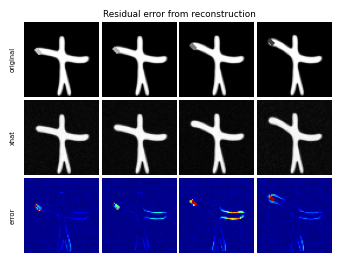

In [12]:
p_idx = 195
# timepoints = np.arange(1, 5)
timepoints = [0, 1, 4, 7]
timepoints

# original image
x = x_orgs_all[p_idx][timepoints]
x_hat = x_recons_all[p_idx][timepoints]
diff = torch.abs(x - x_hat)

# Plot
fig = plot_comparison_starmen(
    imgs=[x.squeeze(),
          x_hat.squeeze(),
          diff.squeeze(),
          ],
    labels=["original", "xhat", "error", "yen seg", "gt ano", "join seg", "ground truth"],
    is_errors=[False, False, True, True, False, True, False],
    same_cbar=False,
    opt={
        "title": "Residual error from reconstruction",
        "base_size": 1}
)
fig.savefig("notebooks/temp/pixel_d.svg")

## Reconstruction with FAM

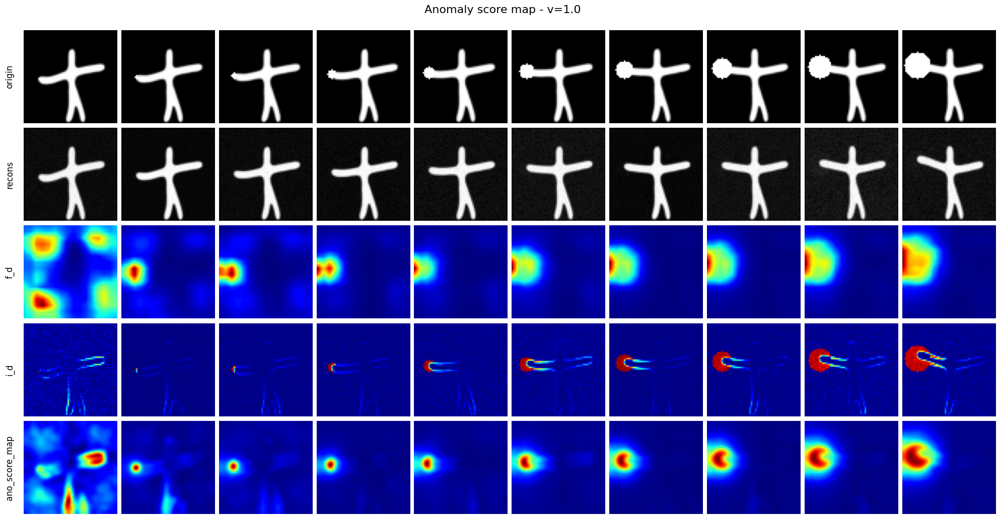

In [50]:
pidx = 156
x = x_orgs_all[pidx]
xhat = x_recons_all[pidx]

out = fam.calculate_anomaly_score_map(xhat, x, sigma=2.)

# Plot anomaly score map
imgs = [
    x.detach().cpu().squeeze(),
    xhat.detach().cpu().squeeze(),
    out["f_d"].detach().cpu().squeeze(),
    out["i_d"].detach().cpu().squeeze(),
    out["ano_map"].detach().cpu().squeeze(),
]

labels = ["origin", "recons", "f_d", "i_d", "ano_score_map"]

title = f"Anomaly score map - v={heatmap_v}"
opt = {"title": title}

fig = plot_comparison_starmen(
    imgs,
    labels,
    is_errors=[False, False, True, True, True],
    opt=opt,
    same_cbar=False,
    display_cbar=True,
)

# fig.savefig("notebooks/temp/recon-fem-gcircle.svg")

### Effect of FAM on pixel distance

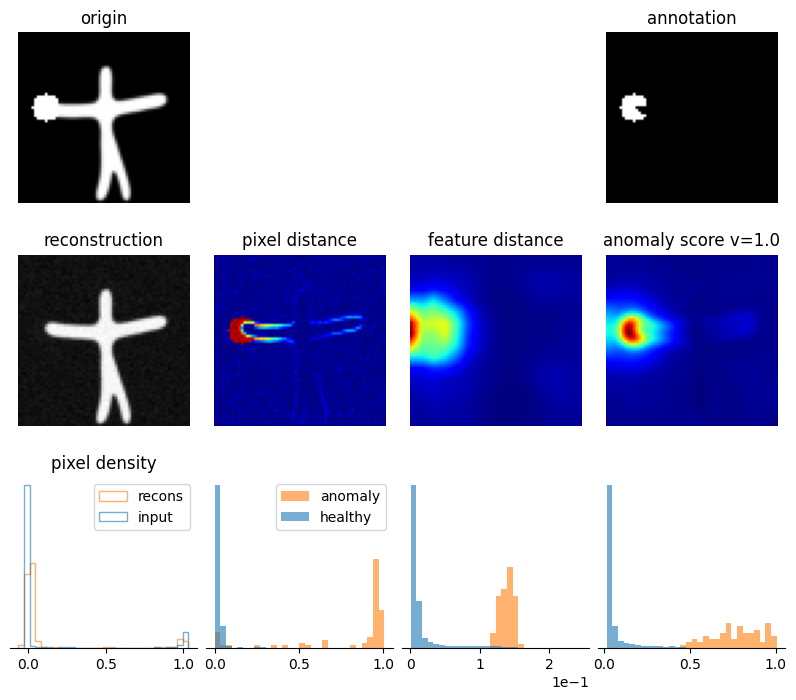

In [51]:

timepoint = 5
fig = plot_fam_error_histogram(
    x[timepoint],
    xhat[timepoint], 
    x_ano_gts_all[pidx][timepoint],
    out["ano_map"][timepoint],
    out["f_d"][timepoint],
    out["i_d"][timepoint],
    heatmap_v=1.
)

fig.savefig("notebooks/temp/fam-effect.svg")

### Histogram error for D_f and D_p

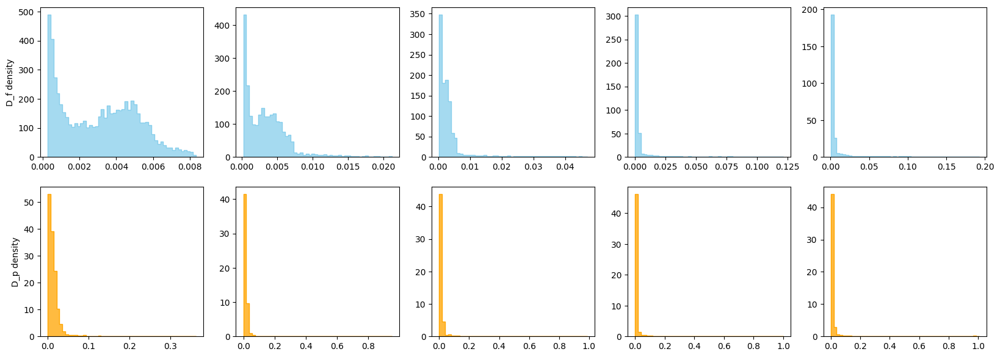

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, axes = plt.subplots(2, 5, figsize=(20, 7))

for i in range(5):
    fd_flat = f_d[i].flatten()
    id_flat = i_d[i].flatten()

    # Create histogram
    ax = axes[0, i]
    sns.histplot(fd_flat, bins=50, kde=False, color='skyblue', stat="density", ax=ax, element="step")
    ax= axes[1, i]
    sns.histplot(id_flat, bins=50, kde=False, color='orange', stat="density", ax=ax, element="step")
    if i != 0:
        axes[0, i].set_ylabel('')
        axes[1, i].set_ylabel('')
    else: 
        axes[0, i].set_ylabel('D_f density')
        axes[1, i].set_ylabel('D_p density')

plt.savefig("notebooks/temp/hist-fd-id.svg")


## Load 1 batch of data

In [48]:
one_batch = next(iter(combine_loader))
one_batch

anomaly_types = combine_ds.anomaly_type
print(len(anomaly_types))

print(len(test_ids))

print(x_recons.shape)

210
210
(210, 10, 1, 64, 64)


## Quantile threshold

In [76]:
from src.utils.metrics import dice

thrs_quantile = [90. , 92.5, 95. , 97.5, 99.]
thrs_quantile

ano_type_unique = ["healthy", "growing_circle", "darker_circle", "darker_line"]
# ano_type_unique = ["healthy"]

# Setup result dict
thrs_dict = {}

In [77]:

for q in thrs_quantile:
    res = {}
    thrs = torch.quantile(pixel_d, q/100)
    res[f"value"] = thrs

    # Binary mask
    ano_seg = torch.where(pixel_d > thrs, 1., 0.)

    # calculate Dice measure
    for ano in ano_type_unique:
        ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
        ano_seg_ano = ano_seg[ano_idx]
        ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
        if ano != "healthy": 
            gt_ano = x_ano_gts_all[ano_idx]
            gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
            dice_score = dice(ano_seg_ano, gt_ano)
            mdice_score =  dice_score.mean()
            res[f"dice_{ano}"] = mdice_score.item()
        elif ano == "healthy":
            fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
            fp = fp.mean()
            res["fp_healthy"] = fp.item()

    # Write to dict
    thrs_dict[f"quantile_q{q}"] = res

    # Pixel quantile
    pixel_d_concat = rearrange(pixel_d, "b t c h w -> h w (b t c)")
    pixel_thrs = torch.quantile(pixel_d_concat, q / 100, dim=2)
    ano_seg_pixel = (pixel_d > pixel_thrs).float()
    res_pixel = {}

    # calculate Dice measure
    for ano in ano_type_unique:
        ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
        ano_seg_ano = ano_seg_pixel[ano_idx]
        ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
        if ano != "healthy": 
            gt_ano = x_ano_gts_all[ano_idx]
            gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
            dice_score = dice(ano_seg_ano, gt_ano)
            mdice_score =  dice_score.mean()
            res_pixel[f"dice_{ano}"] = mdice_score.item()
        elif ano == "healthy":
            fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
            fp = fp.mean()
            res_pixel["fp_healthy"] = fp.item()
    thrs_dict[f"pixel_quantile_q{q}"] = res_pixel

thrs_dict

{'quantile_q90.0': {'value': tensor(0.0235),
  'fp_healthy': 0.09152034670114517,
  'dice_growing_circle': 0.17125456035137177,
  'dice_darker_circle': 0.06662953644990921,
  'dice_darker_line': 0.11591770499944687},
 'pixel_quantile_q90.0': {'fp_healthy': 0.09081249684095383,
  'dice_growing_circle': 0.16526104509830475,
  'dice_darker_circle': 0.06477043777704239,
  'dice_darker_line': 0.1175089105963707},
 'quantile_q92.5': {'value': tensor(0.0274),
  'fp_healthy': 0.06767643243074417,
  'dice_growing_circle': 0.20953279733657837,
  'dice_darker_circle': 0.08591786026954651,
  'dice_darker_line': 0.1457676887512207},
 'pixel_quantile_q92.5': {'fp_healthy': 0.06701790541410446,
  'dice_growing_circle': 0.1951271891593933,
  'dice_darker_circle': 0.07571714371442795,
  'dice_darker_line': 0.1435428261756897},
 'quantile_q95.0': {'value': tensor(0.0355),
  'fp_healthy': 0.044347330927848816,
  'dice_growing_circle': 0.28061383962631226,
  'dice_darker_circle': 0.12164804339408875,
  'd

## Yen threshold

In [78]:
# Use Yen threshold
res = {}
ano_seg_yen = []
# Patient wise
for i in range(pixel_d.shape[0]):

    thrs = threshold_yen(pixel_d[i].numpy())
    ano_seg_patient = (pixel_d[i] > thrs).float()
    ano_seg_yen.append(ano_seg_patient)

ano_seg_yen = torch.stack(ano_seg_yen)
ano_seg_yen.shape

# calculate Dice measure
for ano in ano_type_unique:
    ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
    ano_seg_ano = ano_seg_yen[ano_idx]
    ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
    if ano != "healthy": 
        gt_ano = x_ano_gts_all[ano_idx]
        gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
        dice_score = dice(ano_seg_ano, gt_ano)
        mdice_score =  dice_score.mean()
        res[f"dice_{ano}"] = mdice_score.item()
    elif ano == "healthy":
        fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
        fp = fp.mean()
        res["fp_healthy"] = fp.item()

thrs_dict["yen_patient"] = res


# Yen thrshold the whole dataset
thrs = threshold_yen(pixel_d.numpy())
ano_seg_yen = (pixel_d > thrs).float()
res = {}
# calculate Dice measure
for ano in ano_type_unique:
    ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
    ano_seg_ano = ano_seg_yen[ano_idx]
    ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
    if ano != "healthy": 
        gt_ano = x_ano_gts_all[ano_idx]
        gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
        dice_score = dice(ano_seg_ano, gt_ano)
        mdice_score =  dice_score.mean()
        res[f"dice_{ano}"] = mdice_score.item()
    elif ano == "healthy":
        fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
        fp = fp.mean()
        res["fp_healthy"] = fp.item()
thrs_dict["yen"] = res

## Synthetic result for Pixel distance

In [80]:
import pandas as pd

df = pd.DataFrame(thrs_dict).T
res_cols = ["fp_healthy", "dice_growing_circle", "dice_darker_circle", "dice_darker_line"]
res_cols_perc = [f"{col.removeprefix('dice_')}_perc" for col in res_cols]
for col in res_cols:
    df[f"{col.removeprefix('dice_')}_perc"] = df[col] * 100

df_print = df[res_cols_perc]
df_print = df_print.sort_index()
df_print["anomaly_perc"] = df_print[["growing_circle_perc", "darker_circle_perc", "darker_line_perc"]].mean(axis=1)
df_print

df_print.index.name = "methods"
df_print

,fp_healthy_perc,growing_circle_perc,darker_circle_perc,darker_line_perc,anomaly_perc
methods,,,,,
pixel_quantile_q90.0,9.08125,16.526105,6.477044,11.750891,11.58468
pixel_quantile_q92.5,6.701791,19.512719,7.571714,14.354283,13.812905
pixel_quantile_q95.0,4.310172,23.717736,8.038504,16.959549,16.238597
pixel_quantile_q97.5,2.040804,27.564639,7.193018,16.743448,17.167035
pixel_quantile_q99.0,0.733789,24.888855,4.551049,10.015789,13.151898
quantile_q90.0,9.152035,17.125456,6.662954,11.59177,11.793393
quantile_q92.5,6.767643,20.95328,8.591786,14.576769,14.707278
quantile_q95.0,4.434733,28.061384,12.164804,19.784465,20.003551
quantile_q97.5,2.122217,42.638272,22.375323,33.193457,32.735684


## Ano score with FAM

In [ ]:
feat_d = []
ano_map = []
with torch.no_grad():
    for  i in range(x_orgs_all.shape[0]):
        x = x_orgs_all[i]
        xhat = x_recons_all[i]

        ano, f_d, i_d = heat_map(
            xhat, x, fe, v=1, fe_layers=["layer1", "layer2"], sigma=2.0
        )

        feat_d.append(f_d)
        ano_map.append(ano)

feat_d = torch.stack(feat_d)
ano_map = torch.stack(ano_map)


torch.save(feat_d, "workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/feat_d.pt")
torch.save(ano_map, "workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")

In [107]:
# Load feature distance
feat_d_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/feat_d.pt")
feat_d_all.shape

# Load ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

torch.Size([210, 10, 1, 64, 64])

### Plot example of f_d and i_d

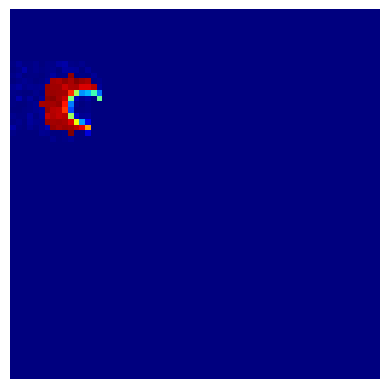

In [86]:
pidx = 167
timepoint = 5

img_fd = feat_d_all[pidx][timepoint]
img_pd = pixel_d[pidx][timepoint]
ano_map = ano_map_all[pidx][timepoint]

plt.imshow(ano_map.squeeze(), cmap="jet")
plt.axis("off")
plt.show()

In [ ]:
# Norm and Yen threshold for anomaly score map
ano_map = norm_tensor(ano_map)
thrs = threshold_yen(ano_map.numpy())
ano_map_yen = (ano_map > thrs).bool()

plt.imshow(ano_map_yen.squeeze(), cmap="jet")
plt.axis("off")
plt.show()

# Mask pixel_d
img_pd_ = img_pd * ano_map_yen
plt.imshow(img_pd_.squeeze(), cmap="jet")
plt.axis("off")
plt.show()

# Norm masked pixel_d
img_pd_ = norm_tensor(img_pd_)
thrs_pd = threshold_yen(img_pd_.numpy())
img_pd_yen = (img_pd_ > thrs_pd).bool()
plt.imshow(img_pd_yen.squeeze(), cmap="jet")
plt.axis("off")
plt.show()

### Yen threshold with FAM anomaly score map

In [114]:
# Use feature distance as filter for pixel distance
ano_map_fam = torch.zeros_like(ano_map_all)
for i, ano in enumerate(ano_map_all):

    # # Strategy 1: norm ano_map -> pixel_d * ano_map_norm -> Yen threshold on pixel_d
    # ano_map_fam[i] = norm_tensor(ano) * pixel_d[i]
    
    # Stratefy 2: use ano_map as mask for pixel_d
    thrs = threshold_yen(ano.numpy())
    ano_map_fam[i] = (ano > thrs).float() * pixel_d[i]

In [115]:
# Use Yen threshold for ano map
res = {}
ano_seg_yen = []

# Patient wise
for i in range(ano_map_fam.shape[0]):

    thrs = threshold_yen(ano_map_fam[i].numpy())
    ano_seg_patient = (ano_map_fam[i] > thrs).float()
    ano_seg_yen.append(ano_seg_patient)

ano_seg_yen = torch.stack(ano_seg_yen)
ano_seg_yen.shape
ano_seg_yen = ano_map_fam * ano_seg_yen

# calculate Dice measure
for ano in ano_type_unique:
    ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
    ano_seg_ano = ano_seg_yen[ano_idx]
    ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
    if ano != "healthy": 
        gt_ano = x_ano_gts_all[ano_idx]
        gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
        dice_score = dice(ano_seg_ano, gt_ano)
        mdice_score =  dice_score.mean()
        res[f"dice_{ano}"] = mdice_score.item()
    elif ano == "healthy":
        fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
        fp = fp.mean()
        res["fp_healthy"] = fp.item()

thrs_dict["ano_map_yen_patient"] = res

# Yen thrshold the whole dataset
thrs = threshold_yen(ano_map_fam.numpy())
ano_seg_yen = (ano_map_fam > thrs).float()
res = {}
# calculate Dice measure
for ano in ano_type_unique:
    ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
    ano_seg_ano = ano_seg_yen[ano_idx]
    ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
    if ano != "healthy": 
        gt_ano = x_ano_gts_all[ano_idx]
        gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
        dice_score = dice(ano_seg_ano, gt_ano)
        mdice_score =  dice_score.mean()
        res[f"dice_{ano}"] = mdice_score.item()
    elif ano == "healthy":
        fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
        fp = fp.mean()
        res["fp_healthy"] = fp.item()
thrs_dict["ano_map_yen"] = res

### Plot comparison

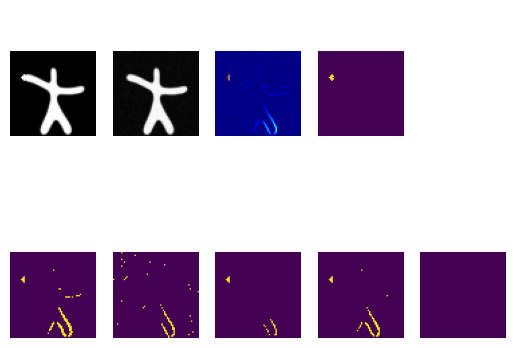

In [105]:
p_idx = 167
timepoint = 2
q = 97

thrs = torch.quantile(pixel_d, q/100)

fig, axes = plt.subplots(2, 5)
for ax in axes.flatten():
    ax.axis("off")

# Original image
ax = axes[0, 0]
ax.imshow(x_orgs_all[p_idx][timepoint].squeeze(), cmap="gray")

# Reconstruction 
ax = axes[0, 1]
ax.imshow(x_recons_all[p_idx][timepoint].squeeze(), cmap="gray")

# Pixel distance
ax = axes[0, 2]
ax.imshow(pixel_d[p_idx][timepoint].squeeze(), cmap="jet")

# Ground truth ano
if not torch.all(x_ano_gts_all[p_idx][timepoint] == 0):
    ax = axes[0, 3]
    ax.imshow(x_ano_gts_all[p_idx][timepoint].squeeze())


# Binary mask
ano_seg = torch.where(pixel_d > thrs, 1., 0.)
ax = axes[1, 0]
ax.imshow(ano_seg[p_idx][timepoint].squeeze())

# Pixel quantile
pixel_d_concat = rearrange(pixel_d, "b t c h w -> h w (b t c)")
pixel_thrs = torch.quantile(pixel_d_concat, q / 100, dim=2)
ano_seg_pixel = (pixel_d > pixel_thrs).float()
ano_seg_pixel.shape
ax = axes[1, 1]
ax.imshow(ano_seg_pixel[p_idx][timepoint].squeeze())

# Yen threshold
thrs = threshold_yen(pixel_d.numpy())
ano_seg_yen = (pixel_d > thrs).float()
ax = axes[1, 2]
ax.imshow(ano_seg_yen[p_idx][timepoint].squeeze())

# Yen threshold patient wise
thrs = threshold_yen(pixel_d[p_idx].numpy())
ano_seg_yen_patient = (pixel_d > thrs).float()
ax = axes[1, 3]
ax.imshow(ano_seg_yen_patient[p_idx][timepoint].squeeze())

# Use AnoScore
thrs = threshold_yen(ano_map_fam.numpy())
ano_seg = (ano_map_fam > thrs).float()
ax = axes[1, 4]
ax.imshow(ano_seg[p_idx][timepoint].squeeze())
# plt.axis("off")
plt.savefig("notebooks/temp/fig.svg")
plt.show()

### Synthesize results 

In [116]:
import pandas as pd

df = pd.DataFrame(thrs_dict).T
res_cols = ["fp_healthy", "dice_growing_circle", "dice_darker_circle", "dice_darker_line"]
res_cols_perc = [f"{col.removeprefix('dice_')}_perc" for col in res_cols]
for col in res_cols:
    df[f"{col.removeprefix('dice_')}_perc"] = df[col] * 100

df_print = df[res_cols_perc]
df_print = df_print.sort_index()
df_print["anomaly_perc"] = df_print[["growing_circle_perc", "darker_circle_perc", "darker_line_perc"]].mean(axis=1)
df_print

df_print.index.name = "methods"
df_print

,fp_healthy_perc,growing_circle_perc,darker_circle_perc,darker_line_perc,anomaly_perc
methods,,,,,
ano_map_yen,0.203597,60.530871,65.254021,62.455344,62.746745
ano_map_yen_patient,0.058504,57.781827,49.797642,44.87696,50.81881
pixel_quantile_q90.0,9.08125,16.526105,6.477044,11.750891,11.58468
pixel_quantile_q92.5,6.701791,19.512719,7.571714,14.354283,13.812905
pixel_quantile_q95.0,4.310172,23.717736,8.038504,16.959549,16.238597
pixel_quantile_q97.5,2.040804,27.564639,7.193018,16.743448,17.167035
pixel_quantile_q99.0,0.733789,24.888855,4.551049,10.015789,13.151898
quantile_q90.0,9.152035,17.125456,6.662954,11.59177,11.793393
quantile_q92.5,6.767643,20.95328,8.591786,14.576769,14.707278


In [82]:
def format_extremes(x, col_name, df):
    """x is a scalar; col_name is a tuple for MultiIndex"""
    rule = highlight_rule[col_name]
    if rule == "max":
        return f"\\textbf{{{x:.3f}}}" if x == df[col_name].max() else f"{x:.3f}"
    else:
        return f"\\textbf{{{x:.3f}}}" if x == df[col_name].min() else f"{x:.3f}"

In [ ]:
# Export to Latex table
highlight_rule = {
    "fp_healthy_perc": "min",
    "growing_circle_perc": "max",
    "darker_circle_perc": "max",
    "darker_line_perc": "max",
    "anomaly_perc": "max",
}

# Apply formatting per column
fmt_dict = {col: (lambda x, col_name=col: format_extremes(x, col_name)) for col in df_print.columns}


latex_code = df_print.style.format(fmt_dict).to_latex()
# latex_code = df_print.to_latex(
#     index=True,
#     float_format="%.3f"
#     # column_format="|c|c|c|"
#     ) 
print(latex_code)

\begin{tabular}{llllll}
 & fp_healthy_perc & growing_circle_perc & darker_circle_perc & darker_line_perc & anomaly_perc \\
methods &  &  &  &  &  \\
ano_map_yen & 0.204 & 60.531 & \textbf{65.254} & 62.455 & 62.747 \\
ano_map_yen_patient & \textbf{0.059} & 57.782 & 49.798 & 44.877 & 50.819 \\
pixel_quantile_q90.0 & 9.081 & 16.526 & 6.477 & 11.751 & 11.585 \\
pixel_quantile_q92.5 & 6.702 & 19.513 & 7.572 & 14.354 & 13.813 \\
pixel_quantile_q95.0 & 4.310 & 23.718 & 8.039 & 16.960 & 16.239 \\
pixel_quantile_q97.5 & 2.041 & 27.565 & 7.193 & 16.743 & 17.167 \\
pixel_quantile_q99.0 & 0.734 & 24.889 & 4.551 & 10.016 & 13.152 \\
quantile_q90.0 & 9.152 & 17.125 & 6.663 & 11.592 & 11.793 \\
quantile_q92.5 & 6.768 & 20.953 & 8.592 & 14.577 & 14.707 \\
quantile_q95.0 & 4.435 & 28.061 & 12.165 & 19.784 & 20.004 \\
quantile_q97.5 & 2.122 & 42.638 & 22.375 & 33.193 & 32.736 \\
quantile_q99.0 & 0.684 & 60.276 & 44.588 & 57.832 & 54.232 \\
yen & 0.192 & \textbf{76.867} & 59.600 & 70.683 & \textbf{69.050

### Effect of healthy-ano distribution

We evaluate the performance (FP, DICE) with different unbalanced dataset

In [117]:
import random

nb_healthy = np.arange(10, 150, 10)
nb_healthy

healthy_idx = [i for i, t in enumerate(anomaly_types) if t == "healthy"]
anomaly_idx = [i for i, t in enumerate(anomaly_types) if t != "healthy"]
len(healthy_idx)
len(anomaly_idx)

yen_thrs_dict = dict()
score_thrs_dict = dict()

# Load ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

# USe feature distance as filter for pixel distance
for i, ano in enumerate(ano_map_all):
    thrs = threshold_yen(ano.numpy())
    ano_map_all[i] = (ano > thrs).float()

ano_map_all = pixel_d * ano_map_all


for n in nb_healthy:
    healthy_idx_select = random.sample(healthy_idx, n)
    
    all_idx = healthy_idx_select + anomaly_idx
    healthy_perc = n / len(all_idx) * 100

    res_one = {}

    # Filter all list
    pixel_d_filter = pixel_d[all_idx]
    # anomaly_types_filter = anomaly_types[all_idx]

    # Yen thrshold the whole dataset
    thrs = threshold_yen(pixel_d_filter.numpy())
    ano_seg_yen = (pixel_d > thrs).float()
    res = {}
    for ano in ano_type_unique:
        ano_idx = [i for i in all_idx if anomaly_types[i] == ano]
        ano_seg_ano = ano_seg_yen[ano_idx]
        ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
        if ano != "healthy": 
            gt_ano = x_ano_gts_all[ano_idx]
            gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
            dice_score = dice(ano_seg_ano, gt_ano)
            mdice_score =  dice_score.mean()
            res[f"dice_{ano}_perc"] = mdice_score.item() * 100
        elif ano == "healthy":
            fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
            fp = fp.mean()
            res["fp_healthy_perc"] = fp.item() * 100
    # Write to result
    yen_thrs_dict[n] = res

    # Use anomaly score map from f_d and i_d
    thrs = threshold_yen(ano_map_all[all_idx].numpy())
    ano_seg_yen = (ano_map_all > thrs).float()
    res = {}
    # calculate Dice measure
    for ano in ano_type_unique:
        ano_idx = [i for i in all_idx if anomaly_types[i] == ano]
        ano_seg_ano = ano_seg_yen[ano_idx]
        ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
        if ano != "healthy": 
            gt_ano = x_ano_gts_all[ano_idx]
            gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
            dice_score = dice(ano_seg_ano, gt_ano)
            mdice_score =  dice_score.mean()
            res[f"dice_{ano}_perc"] = mdice_score.item() * 100
        elif ano == "healthy":
            fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
            fp = fp.mean()
            res["fp_healthy_perc"] = fp.item() * 100
    score_thrs_dict[n] = res
    



/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/skimage/filters/thresholding.py:466: RuntimeWarning: divide by zero encountered in log
  crit = np.log(((P1_sq[:-1] * P2_sq[1:]) ** -1) * (P1[:-1] * (1.0 - P1[:-1])) ** 2)


In [124]:
# Construct dataframe
df = pd.DataFrame(yen_thrs_dict).T
df.index.name = "nb healthy"
df["ano-mean"] = df[["dice_growing_circle_perc", "dice_darker_circle_perc", "dice_darker_line_perc"]].mean(axis=1)
df.columns = [
    "FP", 
    "growing-circle",
    "darker-line",
    "darker-circle",
    "All"
]
df.columns = pd.MultiIndex.from_product([["Pixel score"], df.columns])
df

df2 = pd.DataFrame(score_thrs_dict).T
df2.index.name = "nb healthy"
df2["ano-mean"] = df2[["dice_growing_circle_perc", "dice_darker_circle_perc", "dice_darker_line_perc"]].mean(axis=1)
df2.columns = [
    "FP", 
    "growing-circle",
    "darker-line",
    "darker-circle",
    "All"
]
df2.columns = pd.MultiIndex.from_product([["FAM score"], df2.columns])
df2

df = df.join(df2, how="inner")
df

Pixel score                                                      \
                    FP growing-circle darker-line darker-circle        All   
nb healthy                                                                   
10            0.406006      65.986407   51.071602     64.599639  60.552549   
20            0.507446      66.803777   51.798493     65.485007  61.362425   
30            0.407715      66.803777   51.798493     65.485007  61.362425   
40            0.364197      70.669794   55.109614     68.992335  64.923914   
50            0.293799      71.752459   55.728036     69.355935  65.612143   
60            0.290609      71.752459   55.728036     69.355935  65.612143   
70            0.248082      73.720938   57.321769     70.155454  67.066054   
80            0.285004      73.720938   57.321769     70.155454  67.066054   
90            0.254584      74.452764   57.774156     69.747633  67.324851   
100           0.212549      76.032990   58.882684     70.127809  68.347828   
110           0.185702      76.032990   58.882684     70.127809  68.347828   
120           0.195028      76.385820   59.170777     70.480233  68.678943   
130           0.200383      76.385820   59.170777     70.480233  68.678943   
140           0.199480      76.866609   59.600353     70.683074  69.050012   

           FAM score                                                      
                  FP growing-circle darker-line darker-circle        All  
nb healthy                                                                
10          0.313232      60.297811   63.275141     61.945313  61.839422  
20          0.240234      60.297811   63.275141     61.945313  61.839422  
30          0.211833      60.297811   63.275141     61.945313  61.839422  
40          0.234436      60.297811   63.275141     61.945313  61.839422  
50          0.205029      60.444951   64.422631     62.263441  62.377008  
60          0.204712      60.444951   64.422631     62.263441  62.377008  
70          0.208078      60.444951   64.422631     62.263441  62.377008  
80          0.225525      60.444951   64.422631     62.263441  62.377008  
90          0.206000      60.444951   64.422631     62.263441  62.377008  
100         0.214917      60.444951   64.422631     62.263441  62.377008  
110         0.200639      60.444951   64.422631     62.263441  62.377008  
120         0.197611      60.530871   65.254021     62.455344  62.746745  
130         0.198655      60.530871   65.254021     62.455344  62.746745  
140         0.205479      60.530871   65.254021     62.455344  62.746745

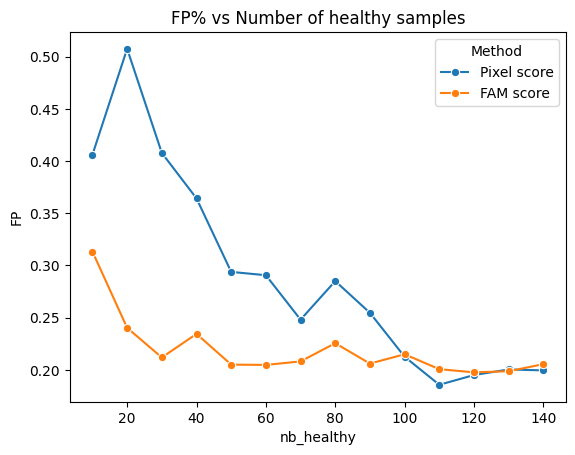

In [126]:
# Plot

import seaborn as sns

# Convert to long-form for seaborn
df_plot = df[[('Pixel score','FP'), ('FAM score','FP')]].copy()
df_plot.columns = ['Pixel score', 'FAM score']
df_plot['nb_healthy'] = df.index
df_plot = df_plot.melt(id_vars='nb_healthy', var_name='Method', value_name='FP')

sns.lineplot(data=df_plot, x='nb_healthy', y='FP', hue='Method', marker='o')
plt.title('FP% vs Number of healthy samples')

plt.savefig(
    "notebooks/temp/fp-vs-nbhealthy.svg",
    bbox_inches='tight',   # removes extra whitespace
    dpi=300                # higher resolution for raster formats (ignored for SVG)
)

plt.show()


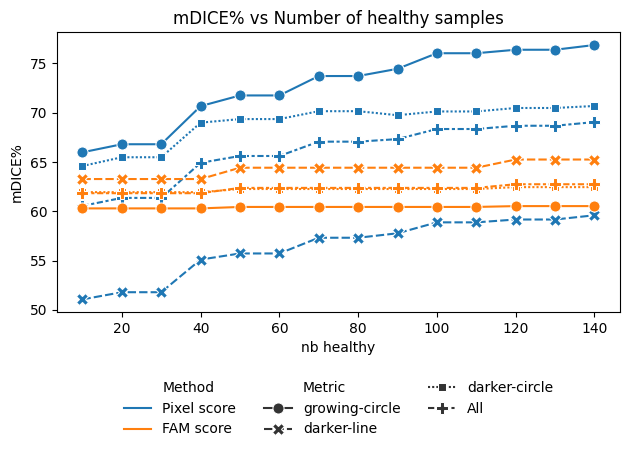

In [127]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# List of metrics and methods
metrics = ['growing-circle', 'darker-line', 'darker-circle', 'All']
methods = ['Pixel score', 'FAM score']

# Prepare long-form DataFrame
df_plot = pd.DataFrame(index=df.index)

for method in methods:
    for metric in metrics:
        df_plot.loc[:, f'{method}_{metric}'] = df[(method, metric)]

# Reset index and melt for seaborn
df_plot = df_plot.reset_index().melt(id_vars='nb healthy', var_name='Method-Metric', value_name='mDICE%')

# Split 'Method-Metric' into two columns for seaborn
df_plot[['Method', 'Metric']] = df_plot['Method-Metric'].str.split('_', expand=True)

# Plot with hue=Method (color) and style=Metric (marker/line)
# plt.figure(figsize=(10,6))
sns.lineplot(data=df_plot, 
             x='nb healthy', 
             y='mDICE%', 
             hue='Method', 
             style='Metric', 
             markers=True, 
             dashes=True,
             markersize=8)
plt.title('mDICE% vs Number of healthy samples')
plt.grid(False)
plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.2),  
    ncol=3,                      
    frameon=False                
)
plt.tight_layout()

plt.savefig(
    "notebooks/temp/mdice-vs-nbhealthy.svg",
    bbox_inches='tight',   # removes extra whitespace
    dpi=300                # higher resolution for raster formats (ignored for SVG)
)

plt.show()



In [128]:
# Print to LaTex table
latex_code = df.to_latex(
    index=True,
    float_format="%.3f"
    # column_format="|c|c|c|"
    ) 
print(latex_code)

\begin{tabular}{lrrrrrrrrrr}
\toprule
 & \multicolumn{5}{r}{Pixel score} & \multicolumn{5}{r}{FAM score} \\
 & FP & growing-circle & darker-line & darker-circle & All & FP & growing-circle & darker-line & darker-circle & All \\
nb healthy &  &  &  &  &  &  &  &  &  &  \\
\midrule
10 & 0.406 & 65.986 & 51.072 & 64.600 & 60.553 & 0.313 & 60.298 & 63.275 & 61.945 & 61.839 \\
20 & 0.507 & 66.804 & 51.798 & 65.485 & 61.362 & 0.240 & 60.298 & 63.275 & 61.945 & 61.839 \\
30 & 0.408 & 66.804 & 51.798 & 65.485 & 61.362 & 0.212 & 60.298 & 63.275 & 61.945 & 61.839 \\
40 & 0.364 & 70.670 & 55.110 & 68.992 & 64.924 & 0.234 & 60.298 & 63.275 & 61.945 & 61.839 \\
50 & 0.294 & 71.752 & 55.728 & 69.356 & 65.612 & 0.205 & 60.445 & 64.423 & 62.263 & 62.377 \\
60 & 0.291 & 71.752 & 55.728 & 69.356 & 65.612 & 0.205 & 60.445 & 64.423 & 62.263 & 62.377 \\
70 & 0.248 & 73.721 & 57.322 & 70.155 & 67.066 & 0.208 & 60.445 & 64.423 & 62.263 & 62.377 \\
80 & 0.285 & 73.721 & 57.322 & 70.155 & 67.066 & 0.226 & 60.4

## Temporal smoothing with LAFM

In this section, we will look at the effect of using LAFM to increase our segmentation quality. 

In [58]:
out = temp_filter_gaussian_one_patient(
    ano_map=ano_map_all[0],
    age=ages[0],
    i_d=pixel_d[0]
)
out.keys()

# ano_map_t = ano_map_all[1]
# ages_t = ages[1]
# ano_map_new = torch.zeros_like(ano_map_t)
# ano_map_ref = torch.zeros_like(ano_map_t)
# for i in range(ano_map_t.shape[0]):
#     ano_map_new[i], ano_map_ref[i] = temp_filter_gaussian(ano_map_t, i, ages_t, sigma=1.)
# # ano_map_new

dict_keys(['ano_map_new', 'ano_map_ref', 'yen_seg'])

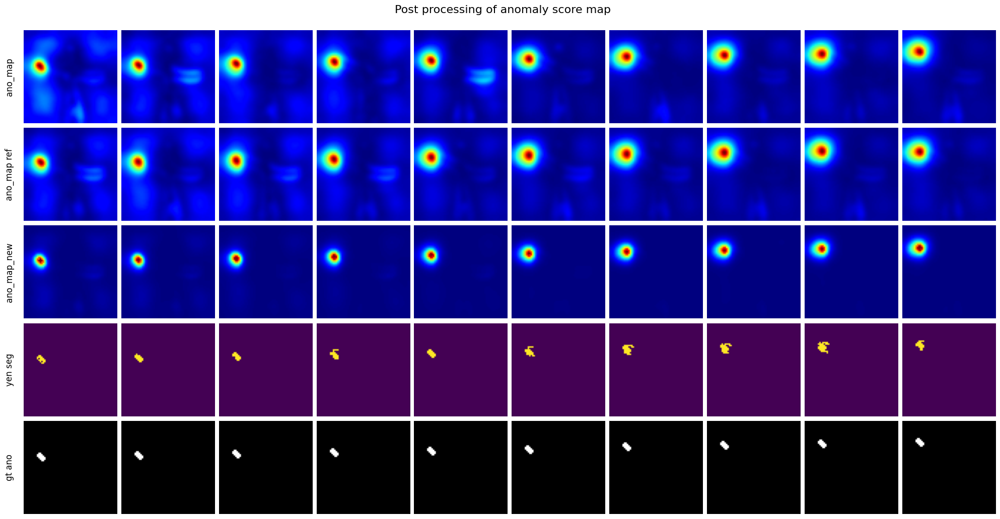

In [65]:
# Load ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

pidx = 195
# 167, 164, 160, 
# healthy: 120, 53
# darker cirlce: 185

ano_map_new = torch.zeros_like(ano_map_all)
ano_map_ref = torch.zeros_like(ano_map_all)
yen_seg = torch.zeros_like(ano_map_all)

for i in range(ano_map_all.shape[0]):
    out = lafm.temp_filter_gaussian_one_patient(
    ano_map=ano_map_all[i],
    age=ages[i],
    i_d=pixel_d[i],
    )

    ano_map_new[i] = out["ano_map_new"]
    ano_map_ref[i] = out["ano_map_ref"]
    yen_seg[i] = out["yen_seg"]

# plot
fig = plot_comparison_starmen(
    imgs=[ano_map_all[pidx].squeeze(),
          ano_map_ref[pidx].squeeze(),
          ano_map_new[pidx].squeeze(),
        #   ano_map_yen_seg.squeeze(),
        #   i_d_yen_seg.squeeze(),
          yen_seg[pidx].squeeze(),
          x_ano_gts_all[pidx].squeeze()
          ],
    labels=["ano_map", "ano_map ref", "ano_map_new", "yen seg", "gt ano", "join seg", "ground truth"],
    is_errors=[True, True, True, False, False, True, False],
    cmaps=["jet"] * 3 + ["viridis"] + ["gray"],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)
fig.savefig("notebooks/temp/example-lafm.svg")

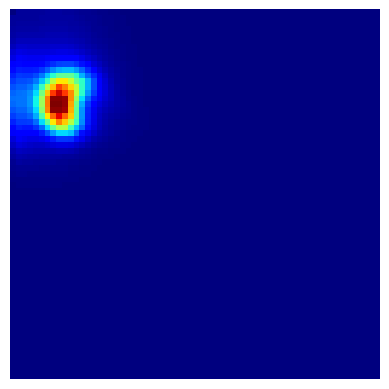

In [72]:
# Load feature distance
feat_d_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/feat_d.pt")
feat_d_all.shape

# Tarimg_ano_map_newet timepoint = 5
# Ref timepoint = 0, 6, 9
timepoint = 5
i_d_new = pixel_d[pidx][timepoint] * ano_map_new[pidx][timepoint]
# i_d_new = norm_tensor(i_d_new)
img_yen_seg = yen_seg[pidx][timepoint]
img_ano_map = ano_map_all[pidx][timepoint]
img_ano_map_ref = ano_map_ref[pidx][timepoint]
img_ano_map_new = ano_map_new[pidx][timepoint]
img_fd = feat_d_all[pidx][timepoint]
img_pd = pixel_d[pidx][timepoint]

plt.imshow(img_ano_map_new.squeeze(), cmap="jet")
plt.axis("off")
plt.show()

In [41]:
# calculate Dice measure
thrs_dict = {}
res = {}
for ano in ano_type_unique:
    ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
    ano_seg_ano = yen_seg[ano_idx]
    ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
    if ano != "healthy": 
        gt_ano = x_ano_gts_all[ano_idx]
        gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
        dice_score = dice(ano_seg_ano, gt_ano)
        mdice_score =  dice_score.mean()
        res[f"dice_{ano}"] = mdice_score.item()
    elif ano == "healthy":
        fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
        fp = fp.mean()
        res["fp_healthy"] = fp.item()

thrs_dict["lafm"] = res
res

{'fp_healthy': 0.0019070637645199895,
 'dice_growing_circle': 0.828931450843811,
 'dice_darker_circle': 0.8192633986473083,
 'dice_darker_line': 0.878909170627594}

### Different strategy for Gaussian weight

In [ ]:
# ReLoad ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape


sigma_ls = np.arange(0., 5., 0.5)
sigma_ls

thrs_dict_lafm = {}
for sigma in sigma_ls:
    res = {}

    ano_map_new = torch.zeros_like(ano_map_all)
    ano_map_ref = torch.zeros_like(ano_map_all)
    yen_seg = torch.zeros_like(ano_map_all)

    for i in range(ano_map_all.shape[0]):
        out = temp_filter_gaussian_one_patient(
        ano_map=ano_map_all[i],
        age=ages[i],
        i_d=pixel_d[i],
        sigma=sigma,
        )

        ano_map_new[i] = out["ano_map_new"]
        ano_map_ref[i] = out["ano_map_ref"]
        yen_seg[i] = out["yen_seg"]

    # Calculate mDICE
    for ano in ano_type_unique:
        ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
        ano_seg_ano = yen_seg[ano_idx]
        ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
        if ano != "healthy": 
            gt_ano = x_ano_gts_all[ano_idx]
            gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
            dice_score = dice(ano_seg_ano, gt_ano)
            mdice_score =  dice_score.mean()
            res[f"dice_{ano}"] = mdice_score.item()
        elif ano == "healthy":
            fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
            fp = fp.mean()
            res["fp_healthy"] = fp.item()

    # Write to dict
    thrs_dict_lafm[f"lafm{sigma}"] = res

In [71]:
# Construct dataFrame 

df_lafm = pd.DataFrame(thrs_dict_lafm).T

res_cols = ["fp_healthy", "dice_growing_circle", "dice_darker_circle", "dice_darker_line"]
res_cols_perc = [f"{col.removeprefix('dice_')}_perc" for col in res_cols]
for col in res_cols:
    df_lafm[f"{col.removeprefix('dice_')}_perc"] = df_lafm[col] * 100

df_lafm = df_lafm[res_cols_perc]
df_lafm = df_lafm.sort_index()
df_lafm["anomaly_perc"] = df_lafm[["growing_circle_perc", "darker_circle_perc", "darker_line_perc"]].mean(axis=1)

df_lafm.index.name = "methods"
df_lafm


,fp_healthy_perc,growing_circle_perc,darker_circle_perc,darker_line_perc,anomaly_perc
methods,,,,,
lafm0.0,0.168815,84.790349,81.665367,86.923605,84.459774
lafm0.5,0.197640,82.441163,82.783639,87.949532,84.391445
lafm1.0,0.190706,82.893145,81.926340,87.890917,84.236801
lafm1.5,0.178158,83.603716,82.681847,87.908715,84.731426
lafm2.0,0.206657,85.539716,81.997228,87.634385,85.057110
lafm2.5,0.182943,86.068642,81.981397,87.352419,85.134153
lafm3.0,0.183903,85.994631,81.779408,87.303704,85.025915
lafm3.5,0.197624,85.890424,81.648165,86.929125,84.822571
lafm4.0,0.193799,85.762334,81.825560,86.892682,84.826859


In [77]:
df_combine = pd.concat([df_print, df_lafm])
df_combine

,fp_healthy_perc,growing_circle_perc,darker_circle_perc,darker_line_perc,anomaly_perc
methods,,,,,
ano_map_yen,0.203597,60.530871,65.254021,62.455344,62.746745
ano_map_yen_patient,0.058504,57.781827,49.797642,44.876960,50.818810
yen,0.192204,76.866609,59.600353,70.683074,69.050012
yen_patient,1.644840,47.369134,58.500499,70.871842,58.913825
lafm0.0,0.168815,84.790349,81.665367,86.923605,84.459774
lafm0.5,0.197640,82.441163,82.783639,87.949532,84.391445
lafm1.0,0.190706,82.893145,81.926340,87.890917,84.236801
lafm1.5,0.178158,83.603716,82.681847,87.908715,84.731426
lafm2.0,0.206657,85.539716,81.997228,87.634385,85.057110


In [83]:
# Print to Latex table
# Export to Latex table
highlight_rule = {
    "fp_healthy_perc": "min",
    "growing_circle_perc": "max",
    "darker_circle_perc": "max",
    "darker_line_perc": "max",
    "anomaly_perc": "max",
}

# Apply formatting per column
fmt_dict = {col: (lambda x, col_name=col: format_extremes(x, col_name, df_combine)) for col in df_combine.columns}

latex_code = df_combine.style.format(fmt_dict).to_latex()
# latex_code = df_print.to_latex(
#     index=True,
#     float_format="%.3f"
#     # column_format="|c|c|c|"
#     ) 
print(latex_code)

\begin{tabular}{lrrrrr}
 & fp_healthy_perc & growing_circle_perc & darker_circle_perc & darker_line_perc & anomaly_perc \\
methods &  &  &  &  &  \\
ano_map_yen & 0.204 & 60.531 & 65.254 & 62.455 & 62.747 \\
ano_map_yen_patient & \textbf{0.059} & 57.782 & 49.798 & 44.877 & 50.819 \\
yen & 0.192 & 76.867 & 59.600 & 70.683 & 69.050 \\
yen_patient & 1.645 & 47.369 & 58.500 & 70.872 & 58.914 \\
lafm0.0 & 0.169 & 84.790 & 81.665 & 86.924 & 84.460 \\
lafm0.5 & 0.198 & 82.441 & \textbf{82.784} & \textbf{87.950} & 84.391 \\
lafm1.0 & 0.191 & 82.893 & 81.926 & 87.891 & 84.237 \\
lafm1.5 & 0.178 & 83.604 & 82.682 & 87.909 & 84.731 \\
lafm2.0 & 0.207 & 85.540 & 81.997 & 87.634 & 85.057 \\
lafm2.5 & 0.183 & \textbf{86.069} & 81.981 & 87.352 & \textbf{85.134} \\
lafm3.0 & 0.184 & 85.995 & 81.779 & 87.304 & 85.026 \\
lafm3.5 & 0.198 & 85.890 & 81.648 & 86.929 & 84.823 \\
lafm4.0 & 0.194 & 85.762 & 81.826 & 86.893 & 84.827 \\
lafm4.5 & 0.183 & 85.783 & 81.683 & 86.779 & 84.748 \\
\end{tabular}



### LAFM with varying n

In this section, we examine the effect of number of observations on performance of LAFM.

Good example for `growing_cicle`: 165, 167

#### plot examples

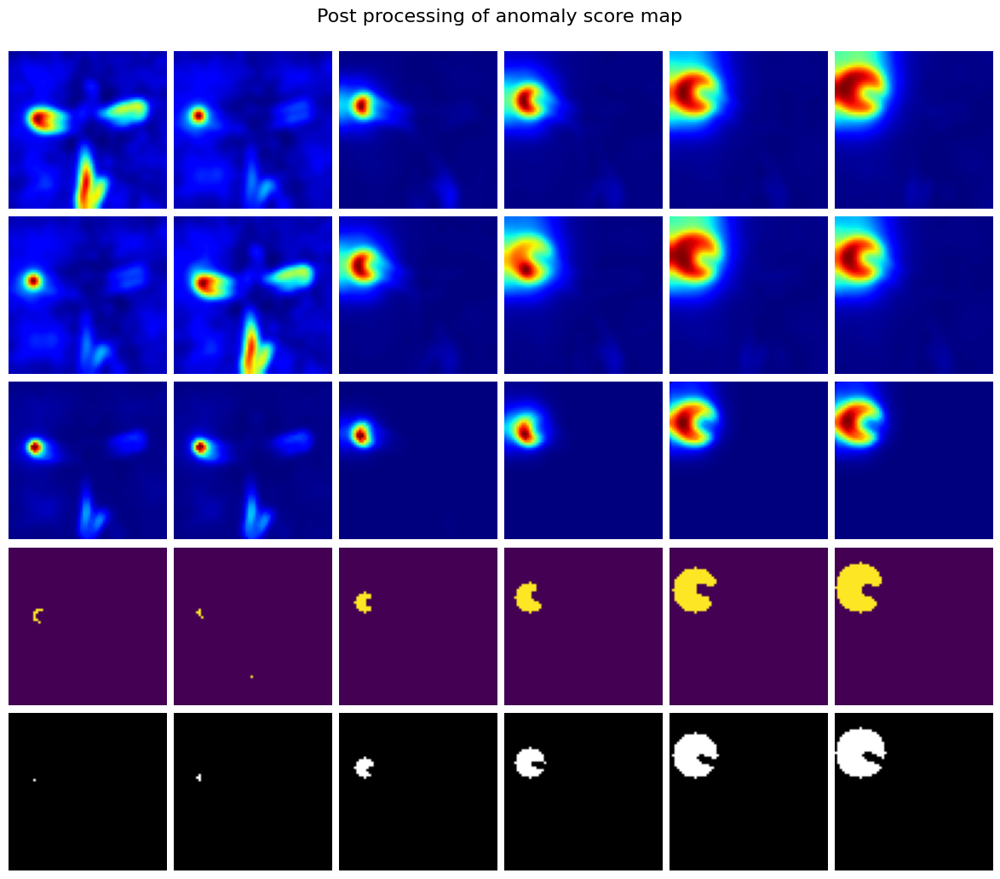

In [74]:
pidx = 165

mask = torch.zeros(10)
mask[[0, 1, 4, 6, 8, 9]] = 1
mask

# # full observation
# mask = torch.ones(10)

# Calculate LAFM
out = lafm.temp_filter_gaussian_one_patient(
    ano_map=ano_map_all[pidx],
    age=ages[pidx],
    i_d=pixel_d[pidx],
    mask=mask
)

gt_ano = x_ano_gts_all[pidx][mask == 1]

fig = plot_comparison_starmen(
    imgs=[out["ano_map"].squeeze(),
          out["ano_map_ref"].squeeze(),
          out["ano_map_new"].squeeze(),
        #   ano_map_yen_seg.squeeze(),
        #   i_d_yen_seg.squeeze(),
          out["yen_seg"].squeeze(),
          gt_ano.squeeze()
          ],
    # labels=["ano_map", "ano_map ref", "ano_map_new", "yen seg", "gt ano"],
    labels=[""]*5,
    is_errors=[True, True, True, False, False],
    cmaps=["jet"] * 3 + ["viridis"] + ["gray"],
    same_cbar=False,
    opt={"title": "Post processing of anomaly score map"}
)

fig.savefig("notebooks/temp/app-lafm-vary-n.svg")

#### Metrics

In [186]:
# ReLoad ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

# USe feature distance as filter for pixel distance - FAM
ano_map_fam = ano_map_all.clone()
for i, ano in enumerate(ano_map_all):
    thrs = threshold_yen(ano.numpy())
    ano_map_fam[i] = (ano > thrs).float()
ano_map_fam = pixel_d * ano_map_all

B, T, C, H, W = x_orgs_all.shape

# seen_grid = [3, 5, 10]
seen_grid = np.arange(2, 11)
nb_folds = 5
res_lafm_seen = {}
res_fam_seen = {}
res_yen_seen = {}
res_lafm_ls = []
res_fam_ls = []
res_yen_ls = []

torch.manual_seed(42)
for fold in range(nb_folds):
    for nb_seen in seen_grid: 
        # Create mask
        mask = torch.zeros((B, T), dtype=torch.long)
        for b in range(B):
            # randomly pick nb_seen[b] unique positions in [0, T)
            idx = torch.randperm(T)[:nb_seen]
            mask[b, idx] = 1

        ##############################################
        # LAFM
        ##############################################
        ano_map_new = torch.zeros(B, nb_seen, C, H, W)
        ano_map_ref = torch.zeros(B, nb_seen, C, H, W)
        yen_seg = torch.zeros(B, nb_seen, C, H, W)

        for i in range(ano_map_all.shape[0]):
            out = temp_filter_gaussian_one_patient(
            ano_map=ano_map_all[i],
            age=ages[i],
            i_d=pixel_d[i],
            sigma=sigma,
            mask=mask[i]
            )

            ano_map_new[i] = out["ano_map_new"]
            ano_map_ref[i] = out["ano_map_ref"]
            yen_seg[i] = out["yen_seg"]

        # Calculate mDICE
        res = {}
        ano_gts_mask = torch.stack(
            [x_ano_gts_all[b, mask[b].bool()] for b in range(B)], dim=0
        )

        for ano in ano_type_unique:
            ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
            ano_seg_ano = yen_seg[ano_idx]
            ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
            if ano != "healthy": 
                gt_ano = ano_gts_mask[ano_idx]
                gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
                dice_score = dice(ano_seg_ano, gt_ano)
                mdice_score =  dice_score.mean()
                res[f"dice_{ano}"] = mdice_score.item()
            elif ano == "healthy":
                fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
                fp = fp.mean()
                res["fp_healthy"] = fp.item()

        # Write to dict
        res_lafm_seen[f"seen-{nb_seen}"] = res

        ##############################################
        # FAM
        ##############################################
        # Yen thrshold the whole dataset

        ano_map_fam_mask = torch.stack(
            [ano_map_fam[b, mask[b].bool()] for b in range(B)], dim=0
        )

        thrs = threshold_yen(ano_map_fam_mask.numpy())
        ano_seg_yen = (ano_map_fam_mask > thrs).float()
        res = {}
        # calculate Dice measure
        for ano in ano_type_unique:
            ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
            ano_seg_ano = ano_seg_yen[ano_idx]
            ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
            if ano != "healthy": 
                gt_ano = ano_gts_mask[ano_idx]
                gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
                dice_score = dice(ano_seg_ano, gt_ano)
                mdice_score =  dice_score.mean()
                res[f"dice_{ano}"] = mdice_score.item()
            elif ano == "healthy":
                fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
                fp = fp.mean()
                res["fp_healthy"] = fp.item()
        res_fam_seen[f"seen-{nb_seen}"] = res

        ##############################################
        # Yen - Pixel distance
        ##############################################
        # Yen thrshold the whole dataset

        pixel_d_mask = torch.stack(
            [pixel_d[b, mask[b].bool()] for b in range(B)], dim=0
        )

        thrs = threshold_yen(pixel_d_mask.numpy())
        ano_seg_yen = (pixel_d_mask > thrs).float()
        res = {}
        # calculate Dice measure
        for ano in ano_type_unique:
            ano_idx = [i for i, t in enumerate(combine_ds.anomaly_type) if t == ano]
            ano_seg_ano = ano_seg_yen[ano_idx]
            ano_seg_ano = rearrange(ano_seg_ano, "b t c h w -> (b t) c h w")
            if ano != "healthy": 
                gt_ano = ano_gts_mask[ano_idx]
                gt_ano = rearrange(gt_ano, "b t c h w -> (b t) c h w")   
                dice_score = dice(ano_seg_ano, gt_ano)
                mdice_score =  dice_score.mean()
                res[f"dice_{ano}"] = mdice_score.item()
            elif ano == "healthy":
                fp = ano_seg_ano.sum(dim=(1, 2, 3)) / torch.ones_like(ano_seg_ano).sum(dim=(1, 2, 3))
                fp = fp.mean()
                res["fp_healthy"] = fp.item()
        res_yen_seen[f"seen-{nb_seen}"] = res
    
    # Write result of each fold to list
    res_lafm_ls.append(pd.DataFrame(res_lafm_seen).T)
    res_fam_ls.append(pd.DataFrame(res_fam_seen).T)
    res_yen_ls.append(pd.DataFrame(res_yen_seen).T)


/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/skimage/filters/thresholding.py:466: RuntimeWarning: divide by zero encountered in log
  crit = np.log(((P1_sq[:-1] * P2_sq[1:]) ** -1) * (P1[:-1] * (1.0 - P1[:-1])) ** 2)
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/skimage/filters/thresholding.py:466: RuntimeWarning: divide by zero encountered in log
  crit = np.log(((P1_sq[:-1] * P2_sq[1:]) ** -1) * (P1[:-1] * (1.0 - P1[:-1])) ** 2)
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/skimage/filters/thresholding.py:466: RuntimeWarning: divide by zero encountered in log
  crit = np.log(((P1_sq[:-1] * P2_sq[1:]) ** -1) * (P1[:-1] * (1.0 - P1[:-1])) ** 2)
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-packages/skimage/filters/thresholding.py:466: RuntimeWarning: divide by zero encountered in log
  crit = np.log(((P1_sq[:-1] * P2_sq[1:]) ** -1) * (P1[:-1] * (1.0 - P1[:-1])) ** 2)
/home/kdang/projects/spartDM/.venv/lib/python3.10/site-p

In [195]:
import pickle

# Save result for later
save_dict = {
    "res_lafm": res_lafm_seen,
    "res_fam": res_fam_seen,
    "res_yen": res_yen_seen
}


# Save
with open("notebooks/exp_results/lafm_vary_nbseen.pkl", "wb") as f:
    pickle.dump(save_dict, f)


In [196]:
# Load result
with open("notebooks/exp_results/lafm_vary_nbseen.pkl", "rb") as f:
    loaded_dict = pickle.load(f)

In [200]:
# Concat result across folds

# lafm experiment
df_lafm = pd.concat(res_lafm_ls)
df_lafm.index = df_lafm.index.str.replace('seen-', '').astype(int)
df_lafm = df_lafm.groupby(df_lafm.index).mean()
df_lafm.sort_index(inplace=True)
df_lafm

# fam experiment
df_fam = pd.concat(res_fam_ls)
df_fam.index = df_fam.index.str.replace('seen-', '').astype(int)
df_fam = df_fam.groupby(df_fam.index).mean()
df_fam.sort_index(inplace=True)
df_fam

# yen experiment
# fam experiment
df_yen = pd.concat(res_yen_ls)
df_yen.index = df_yen.index.str.replace('seen-', '').astype(int)
df_yen = df_yen.groupby(df_yen.index).mean()
df_yen.sort_index(inplace=True)
df_yen

,fp_healthy,dice_growing_circle,dice_darker_circle,dice_darker_line
2,0.001919,0.767700,0.598666,0.700498
3,0.001939,0.764352,0.594072,0.710968
4,0.001905,0.773093,0.590189,0.704195
5,0.001922,0.772335,0.601819,0.709993
6,0.001775,0.768901,0.603895,0.704519
7,0.001958,0.762689,0.592651,0.707042
8,0.001954,0.768801,0.594122,0.713525
9,0.001890,0.767303,0.597210,0.709253
10,0.001922,0.768666,0.596004,0.706831


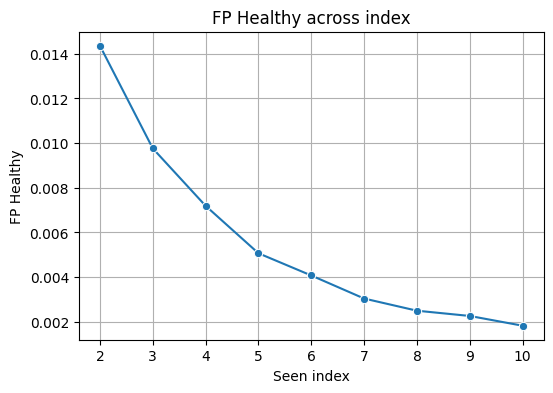

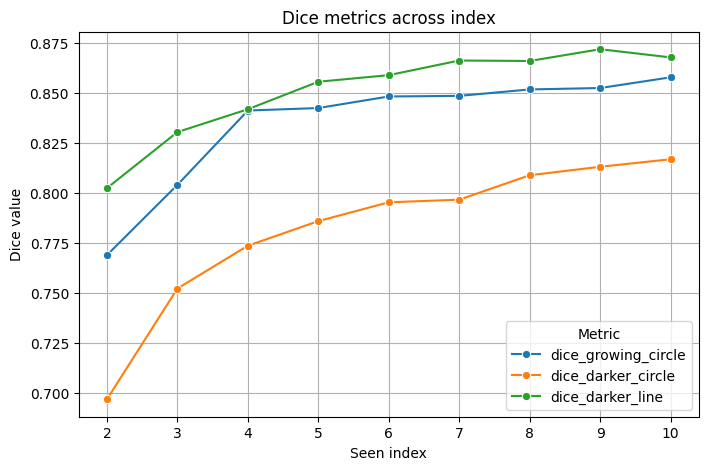

In [ ]:
# Plot
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

df = df_lafm

# --- Plot fp_healthy ---
plt.figure(figsize=(6,4))
sns.lineplot(x=df.index, y=df['fp_healthy'], marker='o')
plt.title("FP Healthy across index")
plt.xlabel("Seen index")
plt.ylabel("FP Healthy")
plt.grid(True)
plt.show()

# --- Plot all dice metrics ---
dice_cols = ['dice_growing_circle', 'dice_darker_circle', 'dice_darker_line']

# Melt the dataframe for seaborn
df_dice = df[dice_cols].copy()
df_dice['index'] = df.index
df_dice_melted = df_dice.melt(id_vars='index', value_vars=dice_cols,
                              var_name='Metric', value_name='Value')

plt.figure(figsize=(8,5))
sns.lineplot(data=df_dice_melted, x='index', y='Value', hue='Metric', marker='o')
plt.title("Dice metrics across index")
plt.xlabel("Seen index")
plt.ylabel("Dice value")
plt.xticks(df.index)
plt.grid(True)
plt.show()


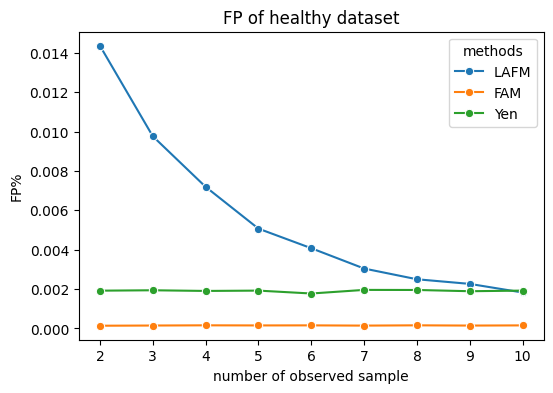

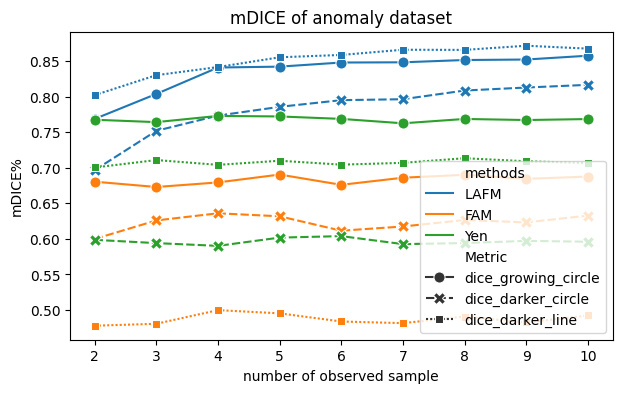

In [214]:
# plot combination of all 3 methods

df_lafm['methods'] = 'LAFM'
df_fam['methods'] = 'FAM'
df_yen['methods'] = 'Yen'

# Concatenate them
df_all = pd.concat([df_lafm, df_fam, df_yen])

# --- FP plot ---
plt.figure(figsize=(6,4))
sns.lineplot(data=df_all, x=df_all.index, y='fp_healthy', hue='methods', marker='o')
plt.title("FP of healthy dataset")
plt.xlabel("number of observed sample")
plt.ylabel("FP%")
plt.xticks(df_all.index.unique())
# plt.grid(True)
plt.savefig("notebooks/temp/fp_varying.svg")
plt.show()

# --- Dice metrics plot ---
dice_cols = ['dice_growing_circle', 'dice_darker_circle', 'dice_darker_line']

# Melt for long format
df_dice = df_all[dice_cols + ['methods']].copy()
df_dice['index'] = df_all.index
df_dice_melted = df_dice.melt(id_vars=['index','methods'], value_vars=dice_cols,
                              var_name='Metric', value_name='Value')

plt.figure(figsize=(7,4))
sns.lineplot(data=df_dice_melted, x='index', y='Value', style='Metric', hue='methods', markers=True, markersize=8)
plt.title("mDICE of anomaly dataset")
plt.xlabel("number of observed sample")
plt.ylabel("mDICE%")
plt.xticks(df_all.index.unique())
# plt.grid(True)
plt.savefig("notebooks/temp/mdice_varying.svg")
plt.show()


# Image anomaly score

In [138]:
from src.utils.metrics import compute_prc, compute_roc


def ano_score_mean_tops(x, s=100):
    x = x.view(x.size(0), -1) 
    top_x, top_idx = torch.topk(x, k=s, dim=1)
    return torch.nanmean(top_x, dim=1)

def ano_score_mean_quantile(x, q=0.95):
    x = x.view(x.size(0), -1) 
    q_val = torch.quantile(x, q, dim=1, keepdim=True)
    mask = x >= q_val  #(B, N)
    top_x = torch.where(mask, x, torch.tensor(float('nan'), device=x.device))
    return torch.nanmean(top_x, dim=1)

def ano_score_max(x):
    x = x.view(x.size(0), -1) 
    return torch.amax(x, dim=1)

def ano_score_mean(x):
    x = x.view(x.size(0), -1) 
    return torch.mean(x, dim=1)

# Function to calculate AUPRC and AUROC for different parameters

def calculate_img_auprc_auroc(ano_map_all, true_labels):
    """
    Args:
        ano_map_all: torch.Tensor (B, C, H, W)
        labels_all: np.array(B) - True binary label (0: healthy, 1:anomaly) 
    """
    # Prepare eval dict
    img_metrics = {}

    auroc_res = {}
    auprc_res = {}

    # Calculate AUPRC, AUROC metrics

    # Max value
    img_score_max = ano_score_max(ano_map_all).numpy()

    # Mean value
    img_score_mean = ano_score_mean(ano_map_all).numpy()

    AUROC_max, _fpr_max, _tpr_max, _threshs = compute_roc(img_score_max, true_labels)
    AUPRC_max, _precisions_max, _recalls_max, _threshs = compute_prc(img_score_max, true_labels)

    AUROC_mean, _fpr_mean, _tpr_mean, _threshs = compute_roc(img_score_mean, true_labels)
    AUPRC_mean, _precisions_mean, _recalls_mean, _threshs = compute_prc(img_score_mean, true_labels)

    # Write to dict
    auroc_res["max"] = AUROC_max
    auroc_res["mean"] = AUROC_mean
    auprc_res["max"] = AUPRC_max
    auprc_res["mean"] = AUPRC_mean

    # Varying parameter for mean_top_k
    for s in np.arange(50, 250, 50):
        img_score_mean_top = ano_score_mean_tops(ano_map_all, s=s).numpy()
        AUROC_mean_top, _fpr_mean_top, _tpr_mean_top, _threshs = compute_roc(img_score_mean_top, true_labels)
        AUPRC_mean_top, _precisions_mean_top, _recalls_mean_top, _threshs = compute_prc(img_score_mean_top, true_labels)
        auroc_res[f"mean{s}"] = AUROC_mean_top
        auprc_res[f"mean{s}"] = AUPRC_mean_top

    # Varying parameter for quantile
    for q in [0.9, 0.925, 0.95, 0.975, 0.99]:
        img_score_quantile = ano_score_mean_quantile(ano_map_all, q=q).numpy()
        AUROC_quantile, _fpr_quantile, _tpr_quantile, _threshs = compute_roc(img_score_quantile, true_labels)
        AUPRC_quantile, _precisions_quantile, _recalls_quantile, _threshs = compute_prc(img_score_quantile, true_labels)
        auroc_res[f"{q*100}q"] = AUROC_quantile
        auprc_res[f"{q*100}q"] = AUPRC_quantile

    # Write to dict
    img_metrics["AUROC"] = auroc_res
    img_metrics["AUPRC"] = auprc_res

    return img_metrics


In [133]:
# Load labels
labels_all = eval_dict["labelPerVol"]
len(labels_all)

# Load feature distance
feat_d_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/feat_d.pt")
feat_d_all.shape

# Load ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

# True label to numpy and repeat each element 10 times for 1 sequence
img_labels = np.array(labels_all)
img_labels = np.repeat(img_labels, 10)
img_labels.shape

ano_map_all = rearrange(ano_map_all, "b t c h w -> (b t) c h w")

## Using pixel distance

In [143]:
pixel_metrics = calculate_img_auprc_auroc(
    rearrange(pixel_d, "b t ... -> (b t) ..."), 
    img_labels)
pixel_metrics

# Construct dataFrame
df_pixel = pd.DataFrame(pixel_metrics)
df_pixel
df_pixel.columns = pd.MultiIndex.from_product([["Pixel"], df_pixel.columns])
df_pixel

Pixel          
            AUROC     AUPRC
max      0.975093  0.928887
mean     0.774581  0.629047
mean50   0.898232  0.778155
mean100  0.865210  0.732078
mean150  0.850021  0.711138
mean200  0.842420  0.700112
90.0q    0.832556  0.685852
92.5q    0.835930  0.690297
95.0q    0.841923  0.699388
97.5q    0.863979  0.730356
99.0q    0.907811  0.792680

## Using FAM

In [151]:
# ReLoad ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

fam_metrics = calculate_img_auprc_auroc(
    rearrange(ano_map_all, "b t ... -> (b t) ..."), 
    img_labels)
fam_metrics

# Construct dataFrame
df_fam = pd.DataFrame(fam_metrics)
df_fam
df_fam.columns = pd.MultiIndex.from_product([["FAM"], df_fam.columns])
df_fam

FAM          
            AUROC     AUPRC
max      0.900169  0.867135
mean     0.356042  0.235576
mean50   0.866299  0.830404
mean100  0.837233  0.798265
mean150  0.812946  0.770733
mean200  0.790673  0.743472
90.0q    0.705344  0.627503
92.5q    0.745362  0.683512
95.0q    0.788424  0.740676
97.5q    0.835722  0.796598
99.0q    0.872428  0.836925

## Using LAFM

In [164]:
# ReLoad ano map 
ano_map_all = torch.load("workdir/diffae_starmen/infer/test_combine_ddim100_noise250/results/ano_map.pt")
ano_map_all.shape

sigma = 0.5

ano_map_new = torch.zeros_like(ano_map_all)
ano_map_ref = torch.zeros_like(ano_map_all)
yen_seg = torch.zeros_like(ano_map_all)
lafm_score = torch.zeros_like(ano_map_all)

for i in range(ano_map_all.shape[0]):
    out = lafm.temp_filter_gaussian_one_patient(
    ano_map=ano_map_all[i],
    age=ages[i],
    i_d=pixel_d[i],
    sigma=sigma,
    use_normalize=False
    )

    ano_map_new[i] = out["ano_map_new"]
    ano_map_ref[i] = out["ano_map_ref"]
    yen_seg[i] = out["yen_seg"]
    lafm_score[i] = out["lafm_score"]

In [165]:
lafm_metrics = calculate_img_auprc_auroc(
    rearrange(lafm_score, "b t c h w -> (b t) c h w"), 
    img_labels)
lafm_metrics

# Construct dataFrame
df_lafm = pd.DataFrame(lafm_metrics)
df_lafm
df_lafm.columns = pd.MultiIndex.from_product([["LAFM"], df_lafm.columns])
df_lafm

LAFM          
            AUROC     AUPRC
max      0.965890  0.920738
mean     0.836920  0.747776
mean50   0.935472  0.876800
mean100  0.924836  0.863796
mean150  0.918718  0.857516
mean200  0.914221  0.852657
90.0q    0.900511  0.834938
92.5q    0.906617  0.843073
95.0q    0.913789  0.852151
97.5q    0.924421  0.863356
99.0q    0.938606  0.881837

## Combine results

In [155]:
df = pd.concat([df_pixel, df_fam, df_lafm], axis=1)
df.columns = df.columns.swaplevel(0, 1)
df = df.sort_index(axis=1)
df = df * 100
df

AUPRC                            AUROC                      
               FAM       LAFM      Pixel        FAM       LAFM      Pixel
max      86.713517  92.073775  92.888703  90.016889  96.589000  97.509333
mean     23.557636  74.777590  62.904663  35.604222  83.692000  77.458056
mean50   83.040445  87.680032  77.815458  86.629889  93.547222  89.823222
mean100  79.826530  86.379565  73.207774  83.723333  92.483556  86.521000
mean150  77.073330  85.751636  71.113842  81.294556  91.871778  85.002111
mean200  74.347172  85.265681  70.011219  79.067333  91.422111  84.242000
90.0q    62.750287  83.493839  68.585225  70.534444  90.051111  83.255556
92.5q    68.351164  84.307303  69.029713  74.536222  90.661667  83.593000
95.0q    74.067564  85.215127  69.938774  78.842444  91.378889  84.192278
97.5q    79.659778  86.335576  73.035553  83.572222  92.442111  86.397889
99.0q    83.692548  88.183742  79.268012  87.242778  93.860556  90.781111

In [156]:

def bold_best(df):
    df_copy = df.copy()
    for metric in df.columns.get_level_values(0).unique():
        max_val = df[metric].max().max()
        df_copy[metric] = df[metric].applymap(
            lambda x: f"\\textbf{{{x:.3f}}}" if x == max_val else f"{x:.3f}"
        )
    return df_copy

df_bold = bold_best(df)

# Export to LaTeX
latex_table = df_bold.to_latex(
    multicolumn=True,
    multirow=True,
    escape=False
)

print(latex_table)

\begin{tabular}{lllllll}
\toprule
 & \multicolumn{3}{r}{AUPRC} & \multicolumn{3}{r}{AUROC} \\
 & FAM & LAFM & Pixel & FAM & LAFM & Pixel \\
\midrule
max & 86.714 & 92.074 & \textbf{92.889} & 90.017 & 96.589 & \textbf{97.509} \\
mean & 23.558 & 74.778 & 62.905 & 35.604 & 83.692 & 77.458 \\
mean50 & 83.040 & 87.680 & 77.815 & 86.630 & 93.547 & 89.823 \\
mean100 & 79.827 & 86.380 & 73.208 & 83.723 & 92.484 & 86.521 \\
mean150 & 77.073 & 85.752 & 71.114 & 81.295 & 91.872 & 85.002 \\
mean200 & 74.347 & 85.266 & 70.011 & 79.067 & 91.422 & 84.242 \\
90.0q & 62.750 & 83.494 & 68.585 & 70.534 & 90.051 & 83.256 \\
92.5q & 68.351 & 84.307 & 69.030 & 74.536 & 90.662 & 83.593 \\
95.0q & 74.068 & 85.215 & 69.939 & 78.842 & 91.379 & 84.192 \\
97.5q & 79.660 & 86.336 & 73.036 & 83.572 & 92.442 & 86.398 \\
99.0q & 83.693 & 88.184 & 79.268 & 87.243 & 93.861 & 90.781 \\
\bottomrule
\end{tabular}



/tmp/ipykernel_4397/914084898.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_copy[metric] = df[metric].applymap(


## Plot

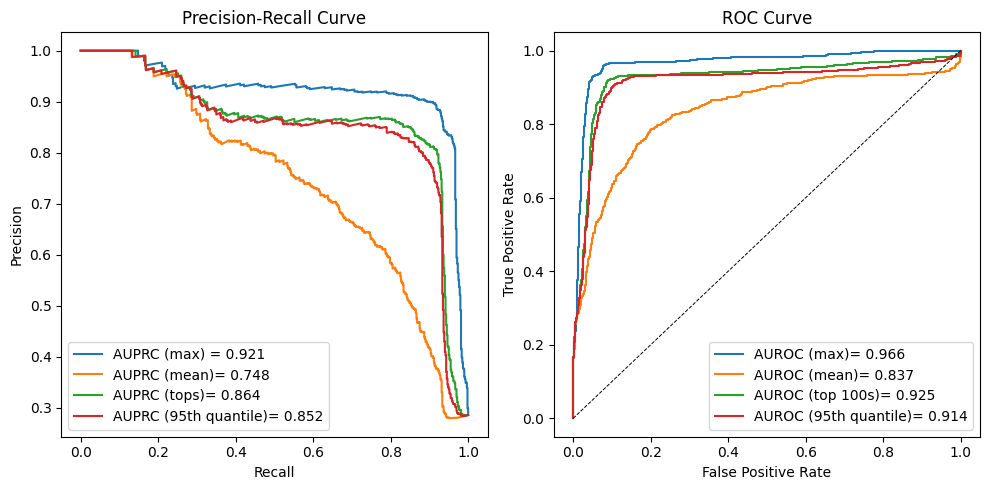

In [168]:
plt.figure(figsize=(10, 5))
# fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# ano_map_ = rearrange(pixel_d, "b t ... -> (b t) ...")

# Use LAFM score
ano_map_ = rearrange(lafm_score, "b t ... -> (b t) ...")

# Max value
img_score_max = ano_score_max(ano_map_).numpy()
AUROC_max, _fpr_max, _tpr_max, _threshs = compute_roc(img_score_max, img_labels)
AUPRC_max, _precisions_max, _recalls_max, _threshs = compute_prc(img_score_max, img_labels)

# Mean value
img_score_mean = ano_score_mean(ano_map_).numpy()
AUROC_mean, _fpr_mean, _tpr_mean, _threshs = compute_roc(img_score_mean, img_labels)
AUPRC_mean, _precisions_mean, _recalls_mean, _threshs = compute_prc(img_score_mean, img_labels)

# Mean top 100
img_score_mean_top = ano_score_mean_tops(ano_map_, s=100).numpy()
AUROC_mean_top, _fpr_mean_top, _tpr_mean_top, _threshs = compute_roc(img_score_mean_top, img_labels)
AUPRC_mean_top, _precisions_mean_top, _recalls_mean_top, _threshs = compute_prc(img_score_mean_top, img_labels)

# 95th quantile
img_score_quantile = ano_score_mean_quantile(ano_map_, q=0.95).numpy()
AUROC_quantile, _fpr_quantile, _tpr_quantile, _threshs = compute_roc(img_score_quantile, img_labels)
AUPRC_quantile, _precisions_quantile, _recalls_quantile, _threshs = compute_prc(img_score_quantile, img_labels)

# AUPRC plot
plt.subplot(1, 2, 1)
# ax = axes[0]
plt.plot(_recalls_max, _precisions_max, label=f'AUPRC (max) = {AUPRC_max:.3f}')
plt.plot(_recalls_mean, _precisions_mean, label=f'AUPRC (mean)= {AUPRC_mean:.3f}')
plt.plot(_recalls_mean_top, _precisions_mean_top, label=f'AUPRC (tops)= {AUPRC_mean_top:.3f}')
plt.plot(_recalls_quantile, _precisions_quantile, label=f'AUPRC (95th quantile)= {AUPRC_quantile:.3f}')

# plt.plot([1, 0], [0, 1], 'k--', lw=0.7)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()

# AUROC plot
plt.subplot(1, 2, 2)
plt.plot(_fpr_max, _tpr_max, label=f'AUROC (max)= {AUROC_max:.3f}')
plt.plot(_fpr_mean, _tpr_mean, label=f'AUROC (mean)= {AUROC_mean:.3f}')
plt.plot(_fpr_mean_top, _tpr_mean_top, label=f'AUROC (top 100s)= {AUROC_mean_top:.3f}')
plt.plot(_fpr_quantile, _tpr_quantile, label=f'AUROC (95th quantile)= {AUROC_quantile:.3f}')

plt.plot([0, 1], [0, 1], 'k--', lw=0.7)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()

plt.tight_layout()
plt.savefig("notebooks/temp/auprc-auroc.pdf")
plt.show()

# Compare different noise level

In [52]:
noise_levels = [50, 100, 250, 400, 500, 600, 750, 800, 1000]

healthy_dict = []
for noise in noise_levels:
    eval_path = f"workdir/diffae_starmen/infer/test_combine_ddim100_noise{noise}/results/eval_dict.json"

    # Read eval dict
    with open(eval_path, 'r') as f:
        eval_dict = json.load(f)
    res = eval_dict["error_semantic_healthy"]
    res["type"] = f"noise_{noise}"
    healthy_dict.append(res)

# Construct dataFrame
df_healthy = pd.DataFrame(healthy_dict)
df_healthy
cols_healthy = df_healthy.columns
cols_healthy = [ 
                'l1errAllMean', 
                # 'l1errAllStd', 
                # 'l2errAllMean', 
                # 'l2errAllStd', 
                # 'fdAllMean', 
                # 'fdAllStd',
                'SSIMMetricsMean', 
                # 'SSIMMetricsStd', 
                'MSSIMMetricsMean',
                # 'MSSIMMetricsStd', 
                'PSNRMetricsMean', 
                # 'PSNRMetricsStd',
                'LPIPSMetricsMean', 
                # 'LPIPSMetricsStd'
                ]
df_healthy.set_index("type", inplace=True)
df_healthy = df_healthy[cols_healthy]

# Change columns name and units
df_healthy.columns = [
    "l1(1e-3)",
    "SSIM(%)",
    "MSSIM(%)",
    "PSNR",
    "LPIPS(1e-3)"
    ]
df_healthy["l1(1e-3)"] = df_healthy["l1(1e-3)"] * 1e3
df_healthy["SSIM(%)"] = df_healthy["SSIM(%)"] * 1e2
df_healthy["MSSIM(%)"] = df_healthy["MSSIM(%)"] * 1e2
df_healthy["LPIPS(1e-3)"] = df_healthy["LPIPS(1e-3)"] * 1e3

# Create multilevel index
# cols_healthy_index = [("healthy", i) for i in cols_healthy]
df_healthy.columns = pd.MultiIndex.from_product([["healthy"], df_healthy.columns])
df_healthy


healthy                                             
             l1(1e-3)    SSIM(%)   MSSIM(%)       PSNR LPIPS(1e-3)
type                                                              
noise_50    10.677508  84.771401  98.863751  36.907757   38.093428
noise_100   11.131892  85.222214  98.901540  35.697483   35.431199
noise_250   12.614901  85.693622  98.851985  32.654606   32.040572
noise_400   13.704125  85.806471  98.751050  31.083687   30.399328
noise_500   14.273232  85.585654  98.677438  30.508492   30.457336
noise_600   14.641641  85.486382  98.635012  30.162279   30.288246
noise_750   15.249796  84.953648  98.547429  29.850203   31.433779
noise_800   15.419873  84.885108  98.512924  29.793068   31.366195
noise_1000  17.952520  83.504897  97.989047  29.539446   34.376624

In [54]:
## Anomaly results
ano_dict = []
for noise in noise_levels:
    eval_path = f"workdir/diffae_starmen/infer/test_combine_ddim100_noise{noise}/results/eval_dict.json"

    # Read eval dict
    with open(eval_path, 'r') as f:
        eval_dict = json.load(f)
    res = eval_dict["error_semantic"]
    res["type"] = f"noise_{noise}"
    ano_dict.append(res)

# Construct dataFrame
df_ano = pd.DataFrame(ano_dict)
cols_ano = [
                # 'l1errAllMean',
                'l1errAnomalyMean',
                'l1errHealthyMean', 
                'l1ratio',
                # 'l1errAllStd', 
                # 'l2errAllMean', 
                # 'l2errAllStd', 
                # 'fdAllMean', 
                # 'fdAllStd',
                # 'SSIMMetricsMean', 
                # 'SSIMMetricsStd', 
                # 'MSSIMMetricsMean',
                # 'MSSIMMetricsStd', 
                # 'PSNRMetricsMean', 
                # 'PSNRMetricsStd',
                # 'LPIPSMetricsMean', 
                # 'LPIPSMetricsStd'
                ]
df_ano.set_index("type", inplace=True)
df_ano = df_ano[cols_ano]

# Change column names and units
df_ano.columns = [
    "l1Ano(1e-3)",
    "l1Healthy(1e-3)",
    "l1ratio"
]
df_ano["l1Ano(1e-3)"] = df_ano["l1Ano(1e-3)"] * 1e3
df_ano["l1Healthy(1e-3)"] = df_ano["l1Healthy(1e-3)"] * 1e3

# cols_ano_index = [("anomaly", i) for i in cols_ano]
df_ano.columns = pd.MultiIndex.from_product([["anomaly"], df_ano.columns])
df_ano

anomaly                           
           l1Ano(1e-3) l1Healthy(1e-3)    l1ratio
type                                             
noise_50    323.192269       11.736829  27.536592
noise_100   508.631945       12.075949  42.119415
noise_250   653.881013       13.110964  49.872841
noise_400   666.405439       14.069515  47.365204
noise_500   669.580877       14.627717  45.774803
noise_600   671.424270       14.999472  44.763195
noise_750   672.777534       15.597901  43.132568
noise_800   673.049629       15.759464  42.707645
noise_1000  674.115419       18.192029  37.055538

In [60]:
# Print to latex table
df_print = df_healthy.join(df_ano, how="inner")
df_print.index = df_print.index.str.replace("noise_", "")
df_print


healthy                                                  anomaly  \
       l1(1e-3)    SSIM(%)   MSSIM(%)       PSNR LPIPS(1e-3) l1Ano(1e-3)   
type                                                                       
50    10.677508  84.771401  98.863751  36.907757   38.093428  323.192269   
100   11.131892  85.222214  98.901540  35.697483   35.431199  508.631945   
250   12.614901  85.693622  98.851985  32.654606   32.040572  653.881013   
400   13.704125  85.806471  98.751050  31.083687   30.399328  666.405439   
500   14.273232  85.585654  98.677438  30.508492   30.457336  669.580877   
600   14.641641  85.486382  98.635012  30.162279   30.288246  671.424270   
750   15.249796  84.953648  98.547429  29.850203   31.433779  672.777534   
800   15.419873  84.885108  98.512924  29.793068   31.366195  673.049629   
1000  17.952520  83.504897  97.989047  29.539446   34.376624  674.115419   

                                 
     l1Healthy(1e-3)    l1ratio  
type                             
50         11.736829  27.536592  
100        12.075949  42.119415  
250        13.110964  49.872841  
400        14.069515  47.365204  
500        14.627717  45.774803  
600        14.999472  44.763195  
750        15.597901  43.132568  
800        15.759464  42.707645  
1000       18.192029  37.055538

In [68]:
highlight_rule = {
    ("healthy", "l1(1e-3)"): "min",
    ("healthy", "SSIM(%)"): "max",
    ("healthy", "MSSIM(%)"): "max",
    ("healthy", "PSNR"): "max",
    ("healthy", "LPIPS(1e-3)"): "min",
    ("anomaly", "l1Ano(1e-3)"): "max",
    ("anomaly", "l1Healthy(1e-3)"): "min",
    ("anomaly", "l1ratio"): "max",
}

def format_extremes(x, col_name):
    """x is a scalar; col_name is a tuple for MultiIndex"""
    rule = highlight_rule[col_name]
    if rule == "max":
        return f"\\textbf{{{x:.3f}}}" if x == df_print[col_name].max() else f"{x:.3f}"
    else:
        return f"\\textbf{{{x:.3f}}}" if x == df_print[col_name].min() else f"{x:.3f}"

# Apply formatting per column
fmt_dict = {col: (lambda x, col_name=col: format_extremes(x, col_name)) for col in df_print.columns}


latex_code = df_print.style.format(fmt_dict).to_latex()
# latex_code = df_print.to_latex(
#     index=True,
#     float_format="%.3f"
#     # column_format="|c|c|c|"
#     ) 
print(latex_code)

\begin{tabular}{lrrrrrrrr}
 & \multicolumn{5}{r}{healthy} & \multicolumn{3}{r}{anomaly} \\
 & l1(1e-3) & SSIM(%) & MSSIM(%) & PSNR & LPIPS(1e-3) & l1Ano(1e-3) & l1Healthy(1e-3) & l1ratio \\
type &  &  &  &  &  &  &  &  \\
50 & \textbf{10.678} & 84.771 & 98.864 & \textbf{36.908} & 38.093 & 323.192 & \textbf{11.737} & 27.537 \\
100 & 11.132 & 85.222 & \textbf{98.902} & 35.697 & 35.431 & 508.632 & 12.076 & 42.119 \\
250 & 12.615 & 85.694 & 98.852 & 32.655 & 32.041 & 653.881 & 13.111 & \textbf{49.873} \\
400 & 13.704 & \textbf{85.806} & 98.751 & 31.084 & 30.399 & 666.405 & 14.070 & 47.365 \\
500 & 14.273 & 85.586 & 98.677 & 30.508 & 30.457 & 669.581 & 14.628 & 45.775 \\
600 & 14.642 & 85.486 & 98.635 & 30.162 & \textbf{30.288} & 671.424 & 14.999 & 44.763 \\
750 & 15.250 & 84.954 & 98.547 & 29.850 & 31.434 & 672.778 & 15.598 & 43.133 \\
800 & 15.420 & 84.885 & 98.513 & 29.793 & 31.366 & 673.050 & 15.759 & 42.708 \\
1000 & 17.953 & 83.505 & 97.989 & 29.539 & 34.377 & \textbf{674.115} & 18.19

### Details for each anomalies dataset

In [83]:
## Anomaly results
ano_type = "growing_circle"
df_list = []
for i, ano_type in enumerate(["growing_circle", "darker_line", "darker_circle"]):
    ano_dict = []
    for noise in noise_levels:
        eval_path = f"workdir/diffae_starmen/infer/test_combine_ddim100_noise{noise}/results/eval_dict.json"

        # Read eval dict
        with open(eval_path, 'r') as f:
            eval_dict = json.load(f)
        res = eval_dict[f"error_semantic_{ano_type}"]
        res["noise"] = f"{noise}"
        ano_dict.append(res)

    df_ano = pd.DataFrame(ano_dict)
    df_ano.set_index("noise", inplace=True)

    df_ano = df_ano[cols_ano]

    # Change column names and units
    df_ano.columns = [
        "l1Ano(1e-3)",
        "l1Healthy(1e-3)",
        "l1ratio"
    ]
    df_ano["l1Ano(1e-3)"] = df_ano["l1Ano(1e-3)"] * 1e3
    df_ano["l1Healthy(1e-3)"] = df_ano["l1Healthy(1e-3)"] * 1e3

    # cols_ano_index = [("anomaly", i) for i in cols_ano]
    df_ano.columns = pd.MultiIndex.from_product([[ano_type], df_ano.columns])

    df_list.append(df_ano)

# Join table
df_ano = pd.concat(df_list, axis=1)
df_ano


growing_circle                            darker_line                  \
         l1Ano(1e-3) l1Healthy(1e-3)    l1ratio l1Ano(1e-3) l1Healthy(1e-3)   
noise                                                                         
50        313.516110       18.809874  16.667635  352.259576       12.660258   
100       553.121269       19.249197  28.734772  384.994179       12.227580   
250       743.801653       16.359096  45.467159  399.815619       13.062567   
400       759.369373       15.821006  47.997540  403.404206       13.982502   
500       763.256192       15.957212  47.831425  404.529184       14.598378   
600       765.464842       16.095724  47.557030  405.295193       14.982574   
750       767.101824       16.422832  46.709473  405.784160       15.374796   
800       767.445207       16.444743  46.668118  405.840188       15.404381   
1000      768.723786       17.108971  44.931034  405.403167       16.317526   

                 darker_circle                             
         l1ratio   l1Ano(1e-3) l1Healthy(1e-3)    l1ratio  
noise                                                      
50     27.824045    349.307805       11.849109  29.479668  
100    31.485722    372.164875       11.993293  31.031084  
250    30.607738    384.890288       13.706249  28.081373  
400    28.850645    388.863146       15.187747  25.603741  
500    27.710556    389.978200       16.020082  24.343084  
600    27.051105    390.802026       16.633246  23.495235  
750    26.392817    391.408443       17.630327  22.200861  
800    26.345764    391.491860       17.996510  21.753765  
1000   24.844646    393.397748       22.926467  17.159109

In [86]:
# Print to Latex
df_print = df_ano.copy(deep=True)

highlight_rule = {
    ("growing_circle", "l1Ano(1e-3)"): "max",
    ("growing_circle", "l1Healthy(1e-3)"): "min",
    ("growing_circle", "l1ratio"): "max",
    ("darker_circle", "l1Ano(1e-3)"): "max",
    ("darker_circle", "l1Healthy(1e-3)"): "min",
    ("darker_circle", "l1ratio"): "max",
    ("darker_line", "l1Ano(1e-3)"): "max",
    ("darker_line", "l1Healthy(1e-3)"): "min",
    ("darker_line", "l1ratio"): "max",
}

# Apply formatting per column
fmt_dict = {col: (lambda x, col_name=col: format_extremes(x, col_name)) for col in df_print.columns}


latex_code = df_print.style.format(fmt_dict).to_latex()
print(latex_code)

\begin{tabular}{lrrrrrrrrr}
 & \multicolumn{3}{r}{growing_circle} & \multicolumn{3}{r}{darker_line} & \multicolumn{3}{r}{darker_circle} \\
 & l1Ano(1e-3) & l1Healthy(1e-3) & l1ratio & l1Ano(1e-3) & l1Healthy(1e-3) & l1ratio & l1Ano(1e-3) & l1Healthy(1e-3) & l1ratio \\
noise &  &  &  &  &  &  &  &  &  \\
50 & 313.516 & 18.810 & 16.668 & 352.260 & 12.660 & 27.824 & 349.308 & \textbf{11.849} & 29.480 \\
100 & 553.121 & 19.249 & 28.735 & 384.994 & \textbf{12.228} & \textbf{31.486} & 372.165 & 11.993 & \textbf{31.031} \\
250 & 743.802 & 16.359 & 45.467 & 399.816 & 13.063 & 30.608 & 384.890 & 13.706 & 28.081 \\
400 & 759.369 & \textbf{15.821} & \textbf{47.998} & 403.404 & 13.983 & 28.851 & 388.863 & 15.188 & 25.604 \\
500 & 763.256 & 15.957 & 47.831 & 404.529 & 14.598 & 27.711 & 389.978 & 16.020 & 24.343 \\
600 & 765.465 & 16.096 & 47.557 & 405.295 & 14.983 & 27.051 & 390.802 & 16.633 & 23.495 \\
750 & 767.102 & 16.423 & 46.709 & 405.784 & 15.375 & 26.393 & 391.408 & 17.630 & 22.201 \\
800 &

# Combine dataset

In [ ]:
# Load anomaly test dataset

import json


def load_test_dataset(split="growing_circle20"):

    import json

    infer_dir = os.path.join(WORK_DIR, "infer", f"{split}_ddim100_noise250")

    # Test dataset
    test_ds = StarmenDataset(
    data_dir=DATA_DIR,
    split=split,
    nb_subject=None,
)
    test_loader = DataLoader(test_ds, batch_size=1, shuffle=True, num_workers=1)
    print(f"Len of test dataset: {len(test_loader)}")


    # Read the reconstruction error files to get the index and corresponding reonconstruction image
    try: 
        eval_result_file = os.path.join(infer_dir, "results", "eval_dict.json")
        with open(eval_result_file, "r") as f:
            eval_dict = json.load(f)
        test_ids = eval_dict["IDs"]
    # test_ids = np.load(recons_idx_path)
    # test_ids = test_ids.squeeze().tolist()
    except FileNotFoundError:
        test_ids = test_ds.ids

    # Load the original (anomalious) image from test dataset by index
    x_orgs = [test_ds.get_images_by_id(id)["img"].squeeze() for id in test_ids]
    x_orgs = np.stack(x_orgs).astype("float32")

    # Load the groundtruth anomaly mask 
    x_ano_gts = []
    for id in test_ds.ids:
        x_ano_gt = test_ds.get_images_by_id(id)["anomaly_gt_seg"]

        if x_ano_gt is None:
            break
        else:
            x_ano_gts.append(x_ano_gt.squeeze())

    if len(x_ano_gts) > 0: 
        x_ano_gts = np.stack(x_ano_gts).astype("float32")
        x_ano_gts.shape

    # Load the original healthy images
    # healthy path example= data/starmen/output_random_noacc/images/SimulatedData__Reconstruction__starman__subject_s0__tp_0.npy
    x_hts = []
    for id in test_ids:
        for t in range(0, 10):
            ht_path = os.path.join(DATA_DIR, "images", f"SimulatedData__Reconstruction__starman__subject_s{id}__tp_{t}.npy")
            ht = np.load(ht_path)
            x_hts.append(ht)
    x_hts = np.stack(x_hts)
    x_hts = rearrange(x_hts, "(b t) h w -> b t h w", t=10)
    x_hts.shape

    # add C dimension
    x_orgs = rearrange(x_orgs, "b t h w -> b t 1 h w")
    if len(x_ano_gts) > 0:
        x_ano_gts = rearrange(x_ano_gts, "b t h w -> b t 1 h w")
    x_hts = rearrange(x_hts, "b t h w -> b t 1 h w")

    # Load reconstruction - xT_inferred
    x_recons = np.load(os.path.join(infer_dir, "results", "recons.npy"))
    x_recons.shape

    # Load reconstruction - from random noise
    x_recons_semantic = np.load(os.path.join(infer_dir, "results", "recons_semantic.npy"))
    x_recons_semantic.shape

    # convert to torch
    x_orgs = to_torch(x_orgs) if not isinstance(x_orgs, torch.Tensor) else x_orgs
    x_hts = to_torch(x_hts) if not isinstance(x_hts, torch.Tensor) else x_hts
    x_ano_gts = to_torch(x_ano_gts) if not isinstance(x_ano_gts, torch.Tensor) else x_ano_gts
    x_recons = to_torch(x_recons) if not isinstance(x_recons, torch.Tensor) else x_recons
    x_recons_semantic = to_torch(x_recons_semantic) if not isinstance(x_recons_semantic, torch.Tensor) else x_recons_semantic

    return {
        "x_orgs": x_orgs,
        "x_hts": x_hts,
        "x_ano_gts": x_ano_gts,
        "x_recons": x_recons,
        "x_recons_semantic": x_recons_semantic,
    }

In [ ]:
# growing_circle20 dataset
out_growing_circle = load_test_dataset(split="growing_circle20")

# darker_line20 dataset
out_darker_line = load_test_dataset(split="darker_line20")

# darker_circle20 dataset
out_darker_circle = load_test_dataset(split="darker_circle20")



Len of test dataset: 20
Len of test dataset: 20
Len of test dataset: 20


In [362]:
# combine all dataset into 1
outs = [out_growing_circle, out_darker_line, out_darker_circle]
for i, out in enumerate(outs):
    b, t, c, h, w = out["x_orgs"].shape
    if i == 0: 
        x_orgs = out["x_orgs"]
        x_recons = out["x_recons"]
        x_recons_semantic = out["x_recons_semantic"]
        x_ano_gts = out["x_ano_gts"]
        true_label = torch.full((b, t), 1)
    else: 
        x_orgs = torch.concat((x_orgs, out["x_orgs"]))
        x_recons = torch.concat((x_recons, out["x_recons"]))
        x_recons_semantic = torch.concat((x_recons_semantic, out["x_recons_semantic"]))
        if i != 3: 
            x_ano_gts = torch.concat((x_ano_gts, out["x_ano_gts"]))
        y = torch.full((b, t), 1) if i != 3 else torch.full((b, t), 0)
        true_label = torch.concat((true_label, y))

## mDice score

In [372]:
batch = out_growing_circle
b, t, c, h, w = batch["x_orgs"].shape

for i in range(b):
    x_orgs = batch["x_orgs"][i]
    x_recons = batch["x_recons"][i]

## Plot images

In [34]:
ex_healthy = first(iter(test_loader))["x_origin"]
ex_healthy.shape

ex_growing_circle = first(iter(growing_circle_loader))["x_origin"]
ex_growing_circle.shape

ex_darker_circle = next(iter(darker_circle_loader))["x_origin"]
ex_darker_circle.shape

ex_darker_line = next(iter(darker_line_loader))["x_origin"]
ex_darker_line.shape

torch.Size([1, 10, 1, 64, 64])

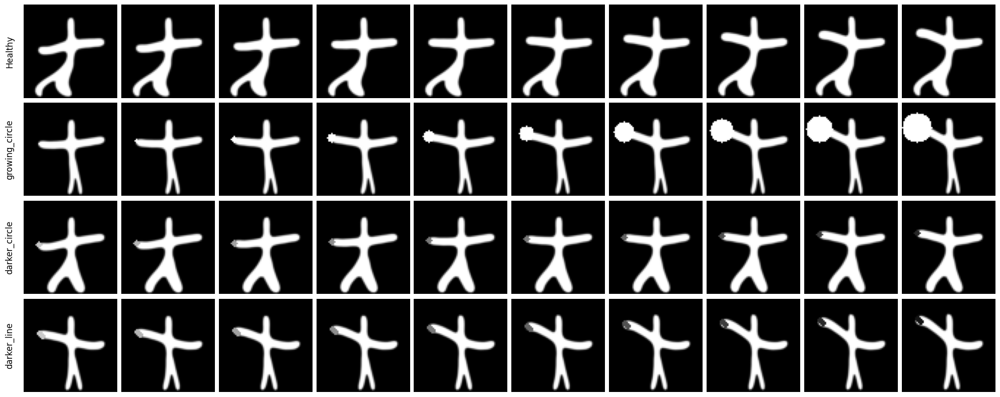

In [ ]:
# Plot anomaly score map
imgs = [
    ex_healthy.detach().cpu().squeeze(),
    ex_growing_circle.detach().cpu().squeeze(),
    ex_darker_circle.detach().cpu().squeeze(),
    ex_darker_line.detach().cpu().squeeze(),
    # i_d.detach().cpu().squeeze(),
    # ano_map.detach().cpu().squeeze(),
]

labels = ["Healthy", "growing_circle", "darker_circle", "darker_line"]

# title = f"Anomaly score map - semantic - healthy - v={heatmap_v}"
# opt = {"title": title}

fig = plot_comparison_starmen(
    imgs,
    labels,
    is_errors=[False, False, False, False, True],
    # opt=opt,
    same_cbar=False,
    display_cbar=True,
)